# ModVege grass growth model (Jouven et al. 2006)

- Jouven, M., Carrère, P. and Baumont, R. (2006). 'Model predicting dynamics
  of biomass, structure and digestibility of herbage in managed permanent
  pastures. 1. Model description', *Grass and Forage Science*, vol. 61,
  no. 2, pp. 112-124. DOI: [10.1111/j.1365-2494.2006.00515.x][Jouven1].
- Jouven, M., Carrère, P. and Baumont, R. (2006). 'Model predicting dynamics
  of biomass, structure and digestibility of herbage in managed permanent
  pastures. 2. Model evaluation', *Grass and Forage Science*, vol. 61, no. 2,
  pp. 125-133. DOI: [10.1111/j.1365-2494.2006.00517.x][Jouven2].
- Chemin, Y. (2022). 'modvege', Python. [Online]. Available at
  <https://github.com/YannChemin/modvege> (Accessed 6 September 2022).

[Jouven1]: https://doi.org/10.1111/j.1365-2494.2006.00515.x
[Jouven2]: https://doi.org/10.1111/j.1365-2494.2006.00517.x

Running ModVege using the example data provided in
<https://github.com/YannChemin/modvege>

In [1]:
import os
from datetime import datetime, timezone
import geopandas as gpd
import matplotlib.pyplot as plt
import xarray as xr
import climag.plot_configs as cplt
from climag.modvege_run import run_modvege

In [2]:
print("Last updated:", datetime.now(tz=timezone.utc))

Last updated: 2022-10-19 14:39:40.388157+00:00


In [3]:
DATA_DIR = os.path.join("data", "grass-growth", "modvege")

# define the name of the input params file
PARAMS_FILE = os.path.join(DATA_DIR, "params.csv")

In [4]:
# Ireland boundary
GPKG_BOUNDARY = os.path.join("data", "boundary", "boundaries.gpkg")
ie = gpd.read_file(GPKG_BOUNDARY, layer="NUTS_Ireland_ITM")

In [5]:
# Cork Airport met station coords
LON = -8.48611
LAT = 51.84722

## Using example timeseries data

In [6]:
# define the name of the input timeseries file
TS_FILE = os.path.join(DATA_DIR, "timeseries.csv")

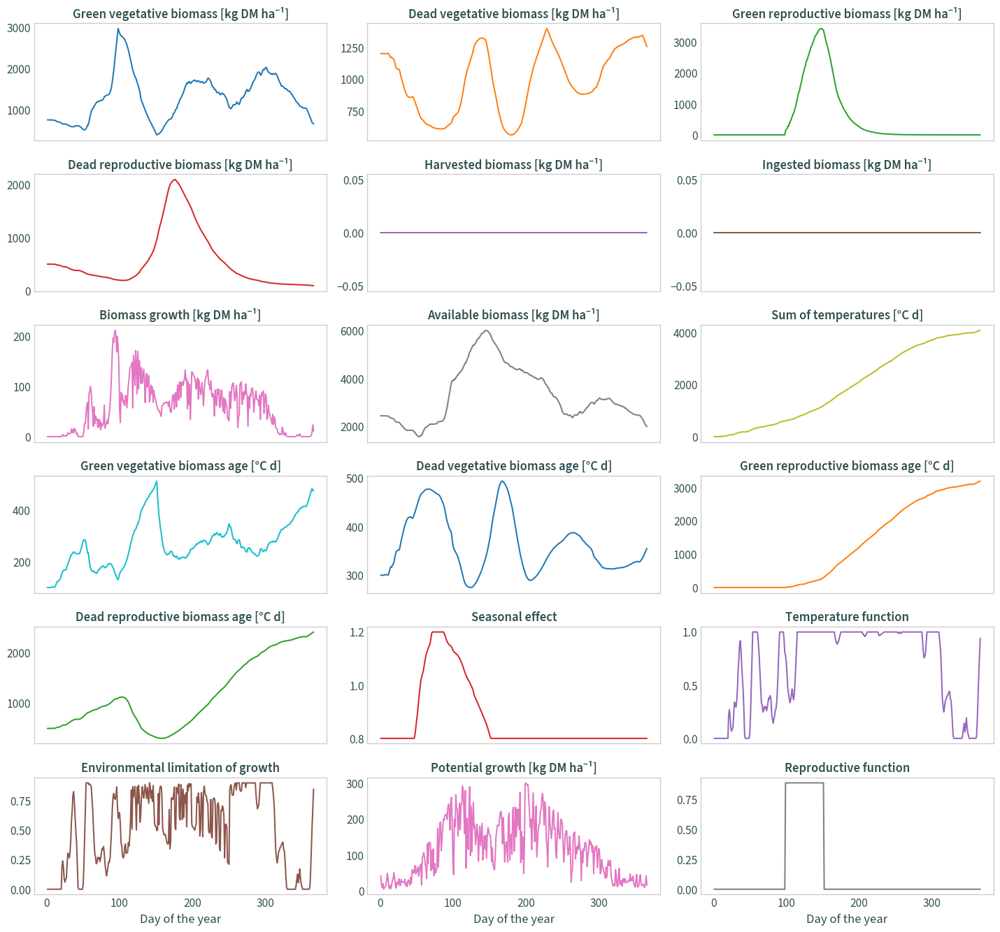

In [7]:
# run the main function using the example data
run_modvege(
    input_params_file=PARAMS_FILE,
    input_timeseries_file=TS_FILE,
    out_dir=DATA_DIR
)

## EURO-CORDEX

### rcp85

In [6]:
# define the name of the input timeseries file
TS_FILE = os.path.join(
    "data", "eurocordex", "IE",
    "evspsblpot_pr_rsds_tas_EUR-11_MPI-M-MPI-ESM-LR_rcp85_r1i1p1_"
    "SMHI-RCA4_v1a_day_20410101-20701231_IE.nc"
)

OUT_DIR = os.path.join(DATA_DIR, "eurocordex", "rcp85")

In [7]:
# # run the main function using the example data
# run_modvege(
#     input_params_file=PARAMS_FILE,
#     input_timeseries_file=TS_FILE,
#     out_dir=OUT_DIR
# )

In [8]:
OUT_FILE = os.path.join(
    OUT_DIR,
    "modvege_EUR-11_MPI-M-MPI-ESM-LR_rcp85_r1i1p1_SMHI-RCA4_v1a_day_"
    "20550101-20551231_IE.nc"
)

data = xr.open_dataset(
    OUT_FILE,
    chunks="auto",
    decode_coords="all"
)

In [9]:
data

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 365, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 2055-01-01T12:00:00 ... 2055-12-31T12...
    height        float64 ...
    rotated_pole  |S1 ...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(365, 2), meta=np.ndarray>
    spatial_ref   int64 ...
Dimensions without coordinates: bnds
Data variables: (12/18)
    gv_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    dv_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    gr_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    dr_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    h_b           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    i_b           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    ...            ...
    dra           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    sea           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    ftm           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    env           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    pgr           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    atr           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-15 23:04:05.457062+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'Conventions': 'CF-1.4', 'contact': 'rossby.cordex@smh...
    input_variables:  ['evspsblpot', 'pr', 'rsds', 'tas']

#### Time subset

In [10]:
data_ie = data.sel(
    time=[
        f"2055-{month}-21T12:00:00.000000000" for month in sorted(
            list(set(data["time"].dt.month.values))
        )
    ]
)

In [11]:
data_ie

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 12, bnds: 2)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 2055-01-21T12:00:00 ... 2055-12-21T12...
    height        float64 ...
    rotated_pole  |S1 ...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(12, 2), meta=np.ndarray>
    spatial_ref   int64 ...
Dimensions without coordinates: bnds
Data variables: (12/18)
    gv_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    dv_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    gr_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    dr_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    h_b           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    i_b           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    ...            ...
    dra           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    sea           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    ftm           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    env           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    pgr           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    atr           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-15 23:04:05.457062+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'Conventions': 'CF-1.4', 'contact': 'rossby.cordex@smh...
    input_variables:  ['evspsblpot', 'pr', 'rsds', 'tas']

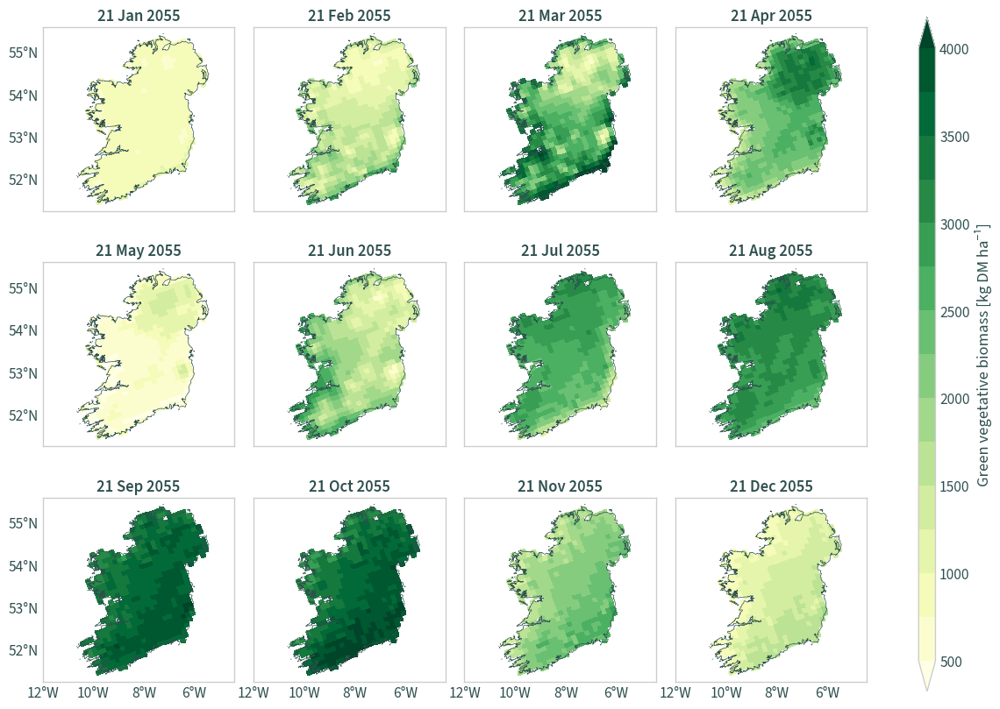

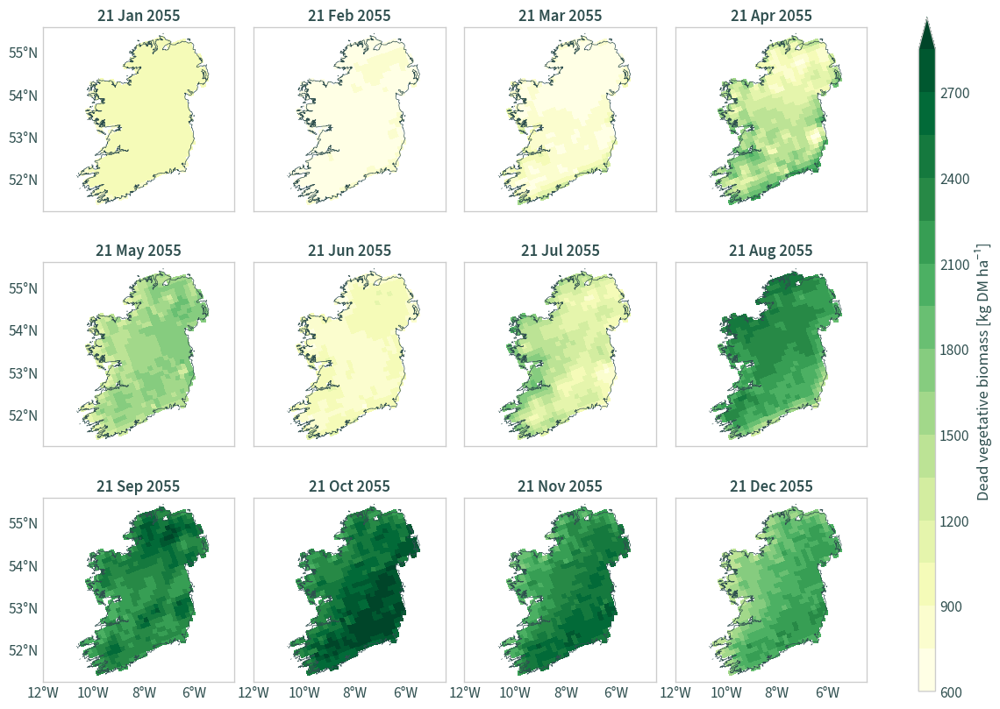

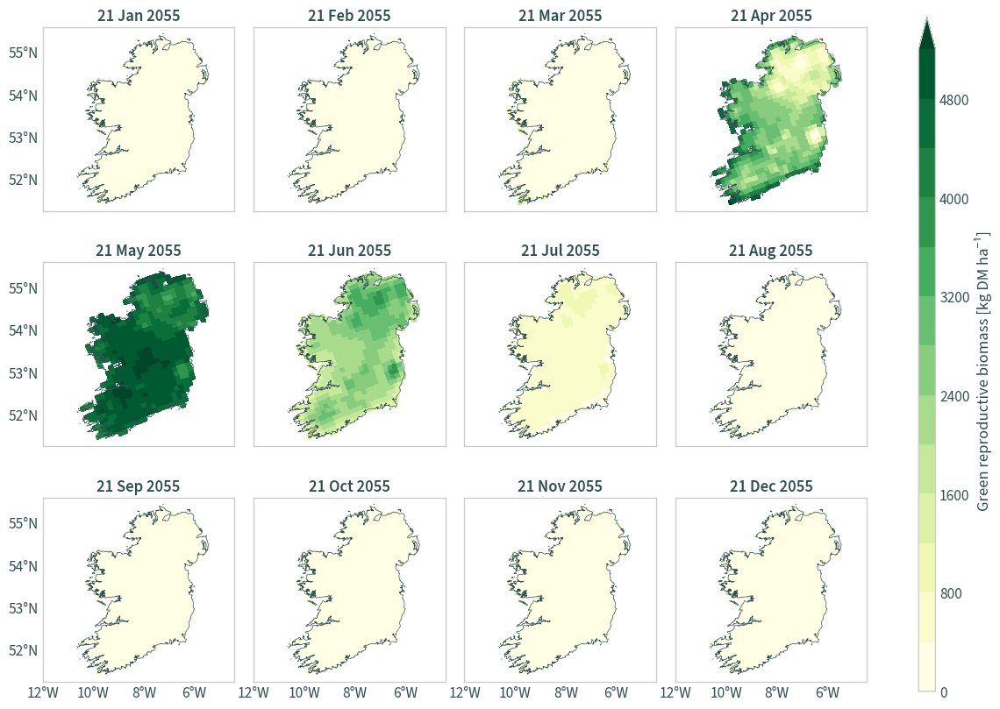

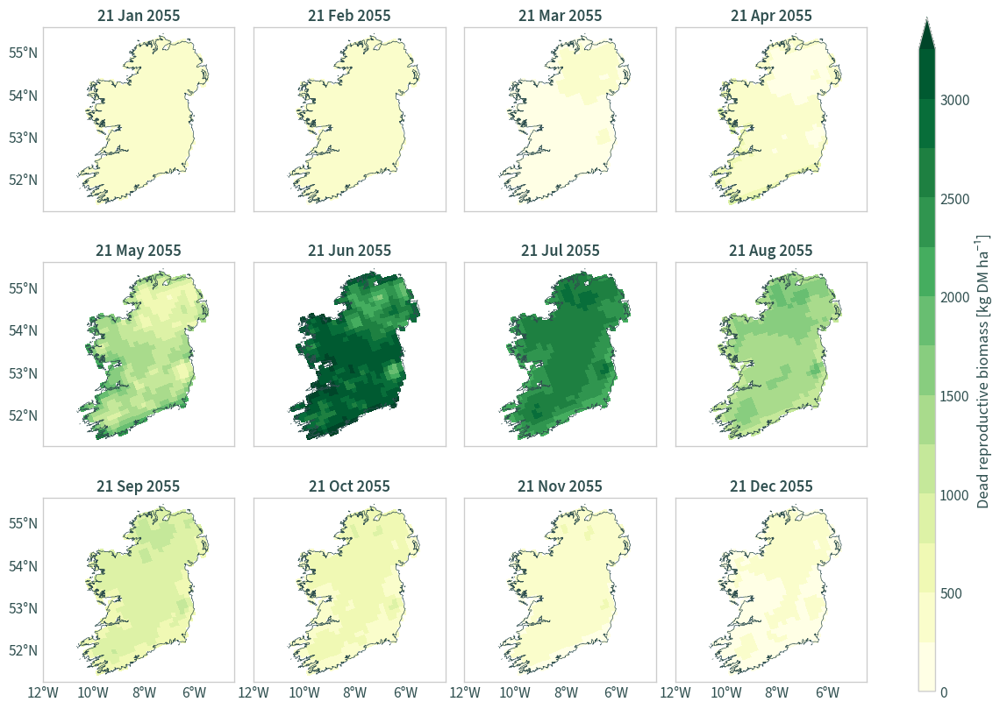

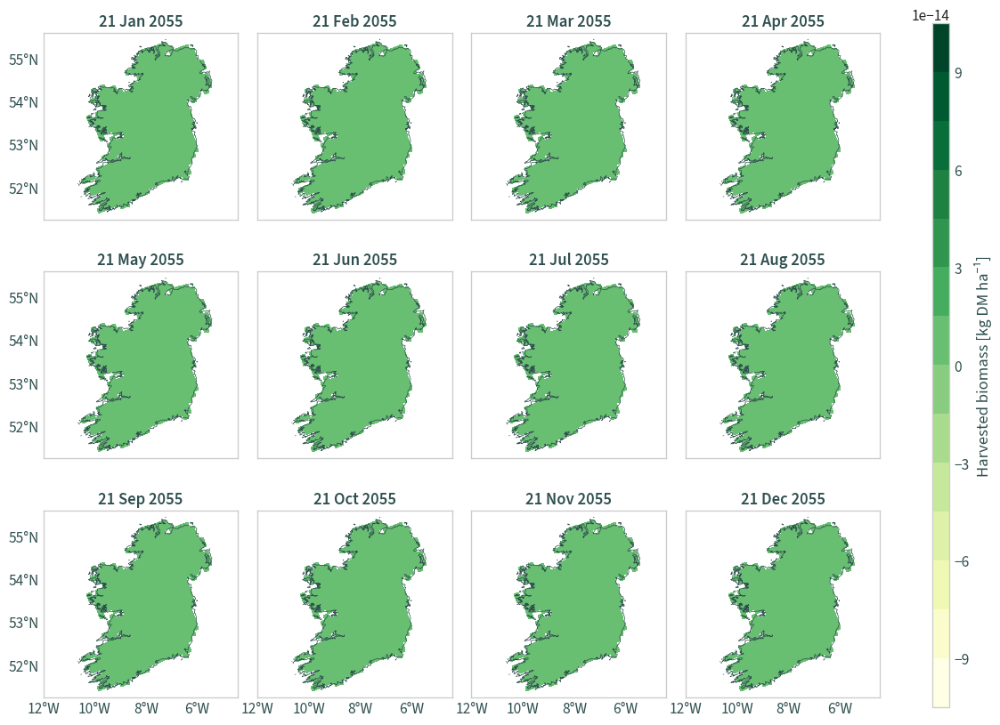

...

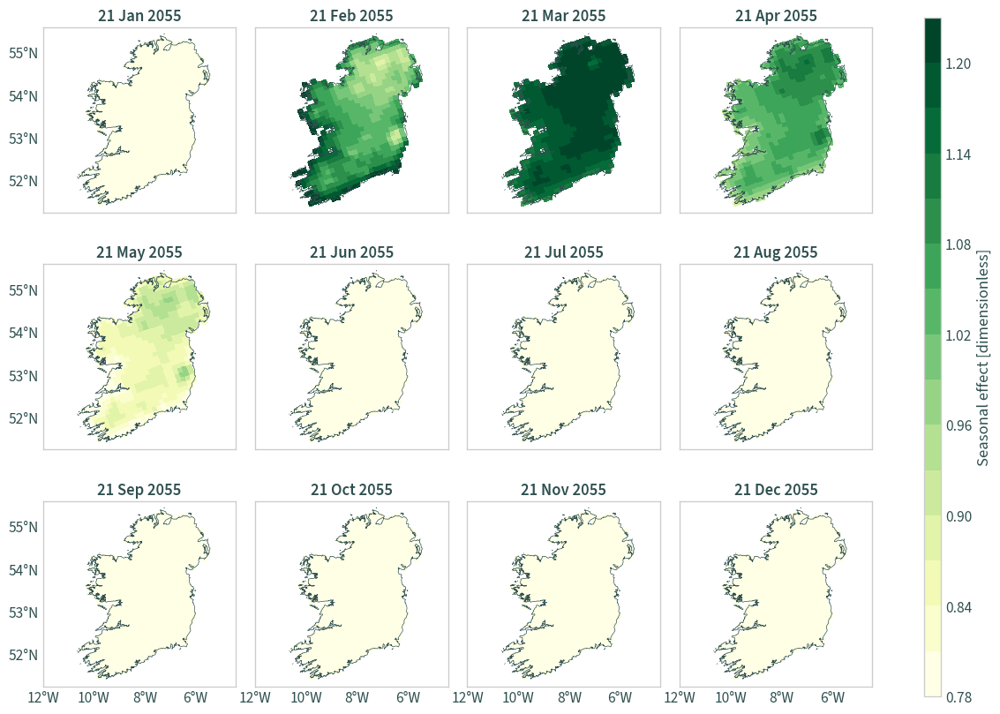

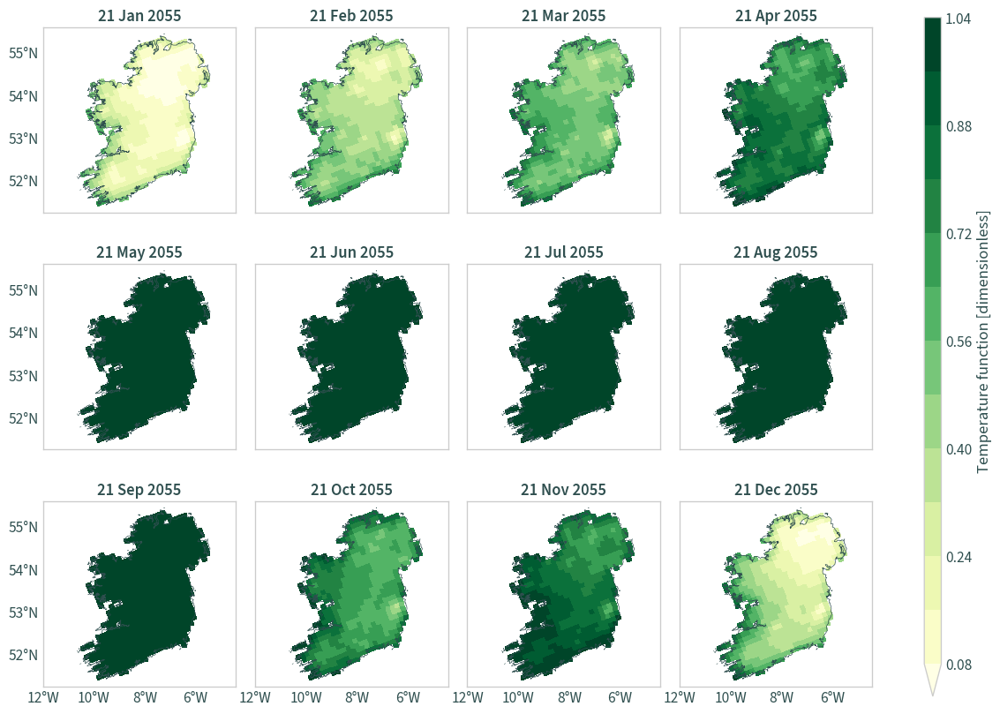

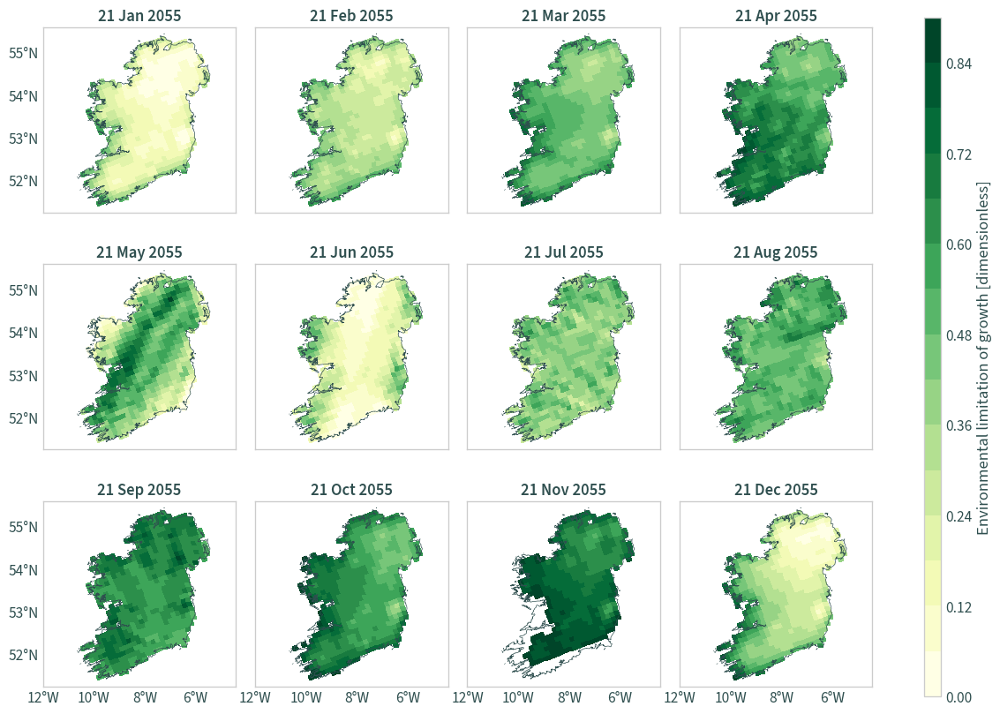

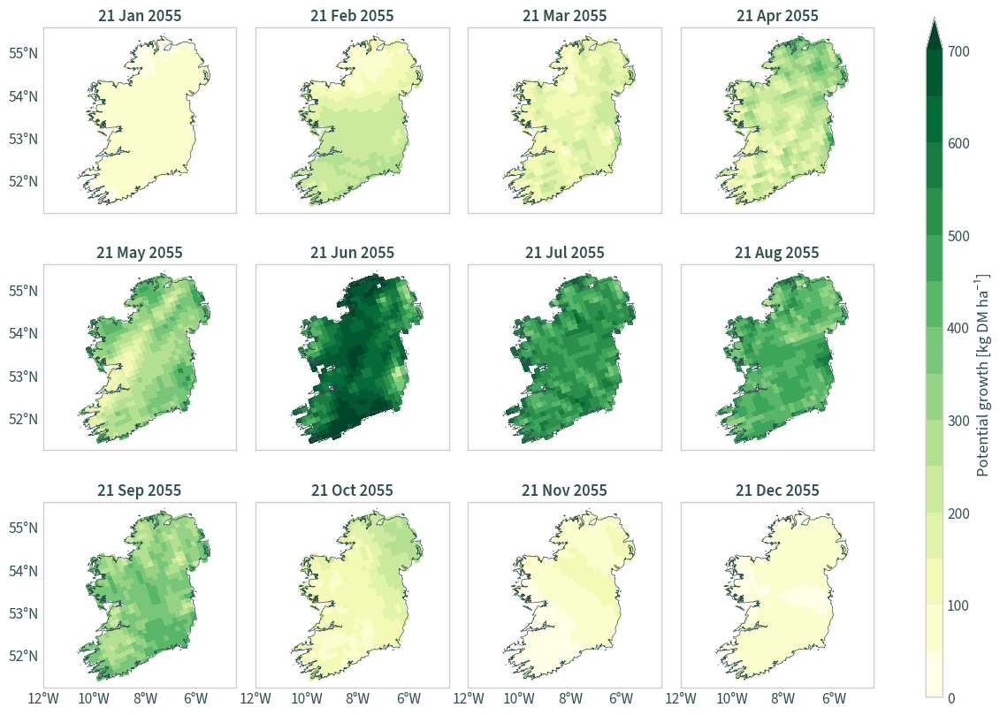

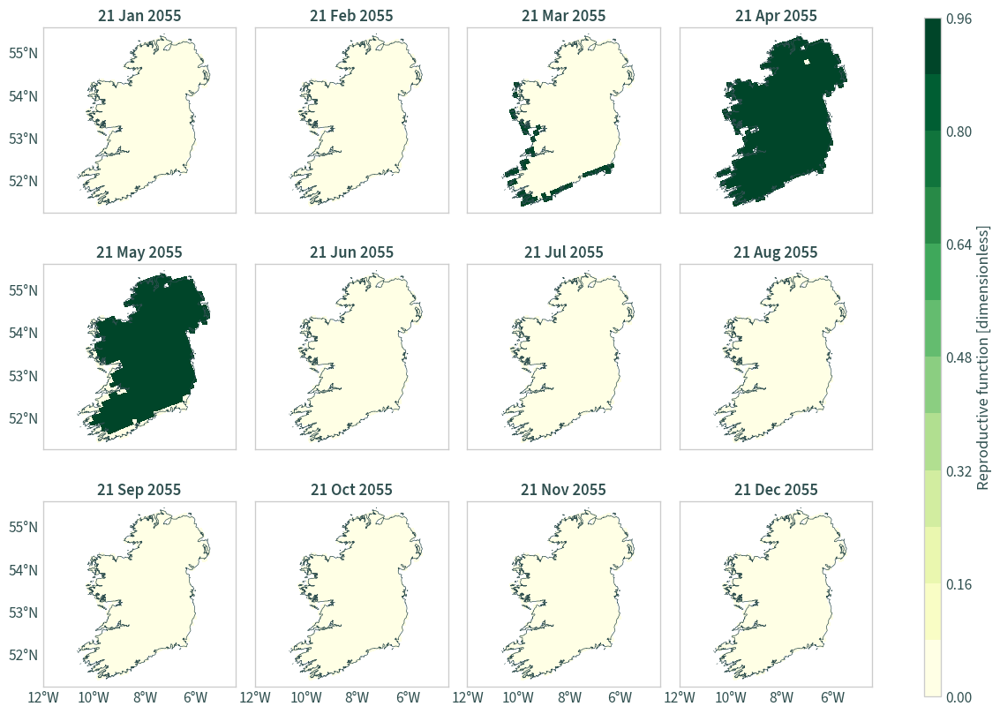

In [13]:
cplt.plot_facet_map_variables(data_ie, ie)

#### Point subset

In [14]:
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

In [15]:
data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

In [16]:
data_ie

<xarray.Dataset>
Dimensions:       (time: 365, bnds: 2)
Coordinates:
    lat           float64 dask.array<chunksize=(), meta=np.ndarray>
    lon           float64 dask.array<chunksize=(), meta=np.ndarray>
    rlat          float64 4.015
    rlon          float64 -16.05
  * time          (time) datetime64[ns] 2055-01-01T12:00:00 ... 2055-12-31T12...
    height        float64 ...
    rotated_pole  |S1 ...
    time_bnds     (time, bnds) datetime64[ns] dask.array<chunksize=(365, 2), meta=np.ndarray>
    spatial_ref   int64 ...
Dimensions without coordinates: bnds
Data variables: (12/18)
    gv_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    dv_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    gr_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    dr_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    h_b           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    i_b           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    ...            ...
    dra           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    sea           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    ftm           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    env           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    pgr           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    atr           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-15 23:04:05.457062+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'Conventions': 'CF-1.4', 'contact': 'rossby.cordex@smh...
    input_variables:  ['evspsblpot', 'pr', 'rsds', 'tas']

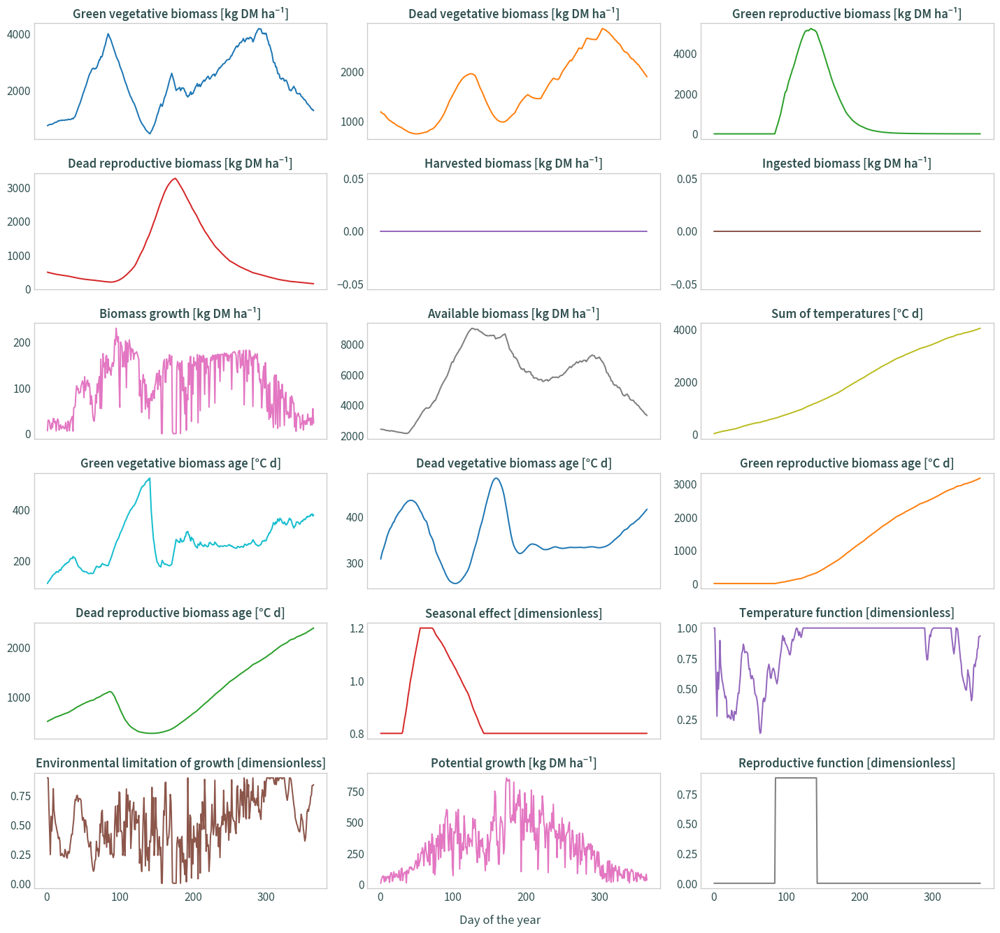

In [17]:
fig, axs = plt.subplots(nrows=6, ncols=3, figsize=(15, 14), sharex=True)

# cycle colours: https://stackoverflow.com/a/53523348
colors = plt.rcParams["axes.prop_cycle"]()

for v, ax in zip(data_ie.data_vars, axs.flat):
    color = next(colors)["color"]
    ax.plot(data_ie["time"].dt.dayofyear, data_ie[v], color=color)
    ax.set_title(
        data_ie[v].attrs["long_name"] + " [" + data_ie[v].attrs["units"] + "]"
    )

fig.supxlabel("Day of the year")

# fig.suptitle(f"ModVege outputs, rcp85 ({LON}, {LAT})")

plt.tight_layout()

plt.show()

### historical

In [18]:
# define the name of the input timeseries file
TS_FILE = os.path.join(
    "data", "eurocordex", "IE",
    "evspsblpot_pr_rsds_tas_EUR-11_MPI-M-MPI-ESM-LR_historical_r1i1p1_"
    "SMHI-RCA4_v1a_day_19760101-20051231_IE.nc"
)

OUT_DIR = os.path.join(DATA_DIR, "eurocordex", "historical")

In [19]:
# # run the main function using the example data
# run_modvege(
#     input_params_file=PARAMS_FILE,
#     input_timeseries_file=TS_FILE,
#     out_dir=OUT_DIR
# )

In [20]:
OUT_FILE = os.path.join(
    OUT_DIR,
    "modvege_EUR-11_MPI-M-MPI-ESM-LR_historical_r1i1p1_SMHI-RCA4_v1a_day_"
    "19900101-19901231_IE.nc"
)

data = xr.open_dataset(
    OUT_FILE,
    chunks="auto",
    decode_coords="all"
)

data

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 365)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12...
    height        float64 ...
    rotated_pole  int64 ...
    spatial_ref   int64 ...
Data variables: (12/18)
    gv_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    dv_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    gr_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    dr_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    h_b           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    i_b           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    ...            ...
    dra           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    sea           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    ftm           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    env           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    pgr           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
    atr           (time, rlat, rlon) float32 dask.array<chunksize=(365, 30, 33), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-13 11:01:06.455671+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'Conventions': 'CF-1.4', 'contact': 'rossby.cordex@smh...
    input_variables:  ['evspsblpot', 'pr', 'rsds', 'tas']

#### Time subset

In [21]:
data_ie = data.sel(
    time=[
        f"1990-{month}-21T12:00:00.000000000" for month in sorted(
            list(set(data["time"].dt.month.values))
        )
    ]
)

data_ie

<xarray.Dataset>
Dimensions:       (rlat: 30, rlon: 33, time: 12)
Coordinates:
    lat           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
    lon           (rlat, rlon) float64 dask.array<chunksize=(30, 33), meta=np.ndarray>
  * rlat          (rlat) float64 3.795 3.905 4.015 4.125 ... 6.765 6.875 6.985
  * rlon          (rlon) float64 -17.05 -16.94 -16.82 ... -13.74 -13.63 -13.53
  * time          (time) datetime64[ns] 1990-01-21T12:00:00 ... 1990-12-21T12...
    height        float64 ...
    rotated_pole  int64 ...
    spatial_ref   int64 ...
Data variables: (12/18)
    gv_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    dv_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    gr_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    dr_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    h_b           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    i_b           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    ...            ...
    dra           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    sea           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    ftm           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    env           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    pgr           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
    atr           (time, rlat, rlon) float32 dask.array<chunksize=(12, 30, 33), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-13 11:01:06.455671+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'Conventions': 'CF-1.4', 'contact': 'rossby.cordex@smh...
    input_variables:  ['evspsblpot', 'pr', 'rsds', 'tas']

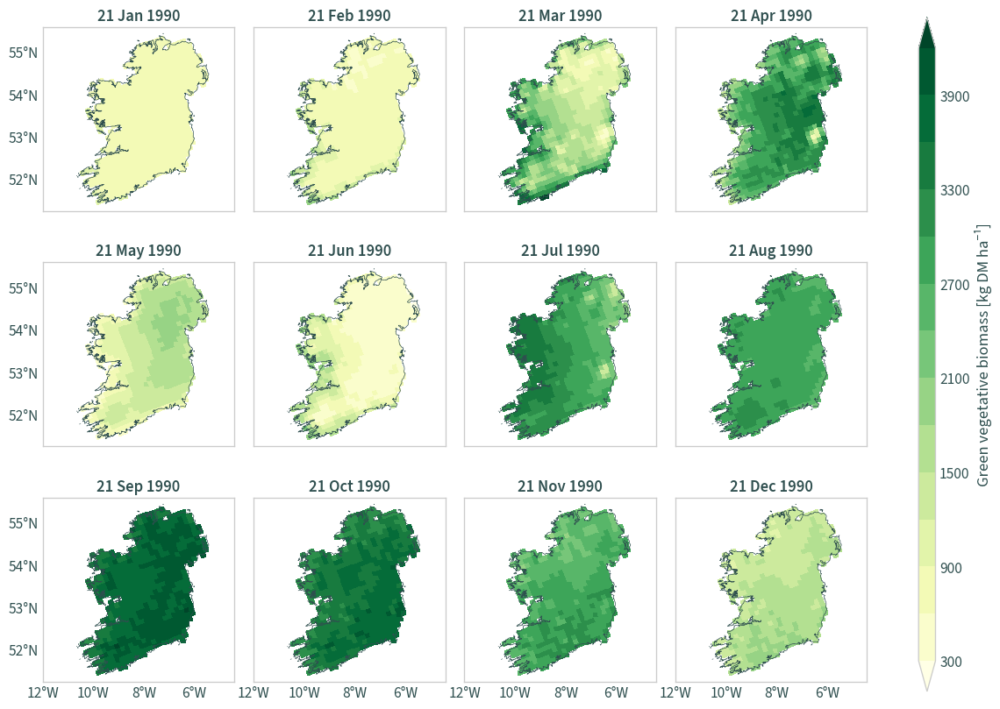

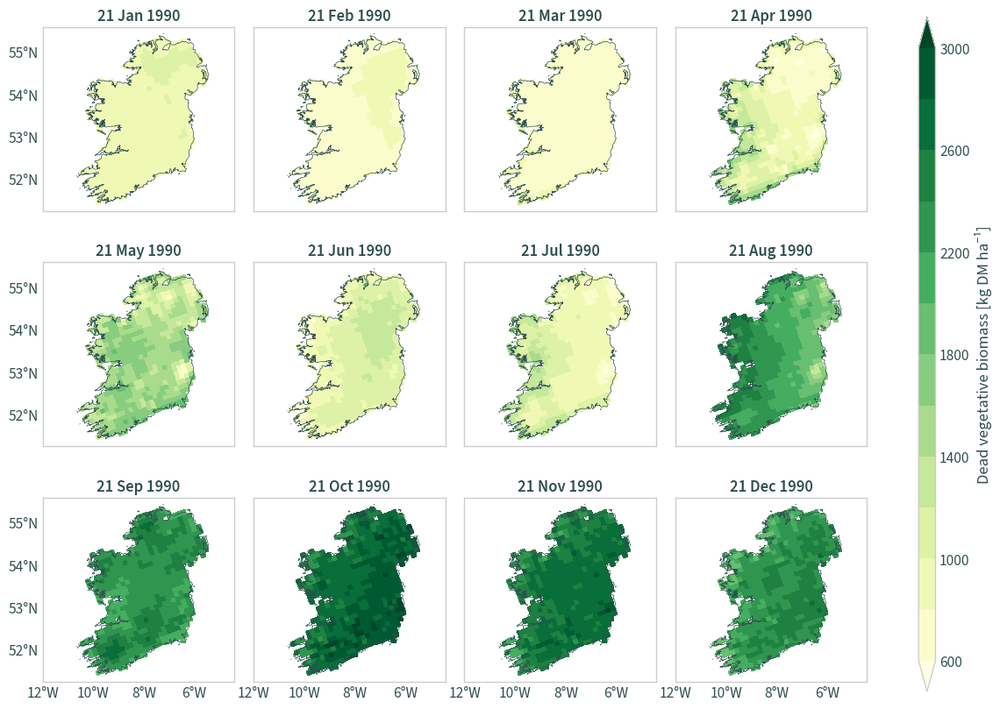

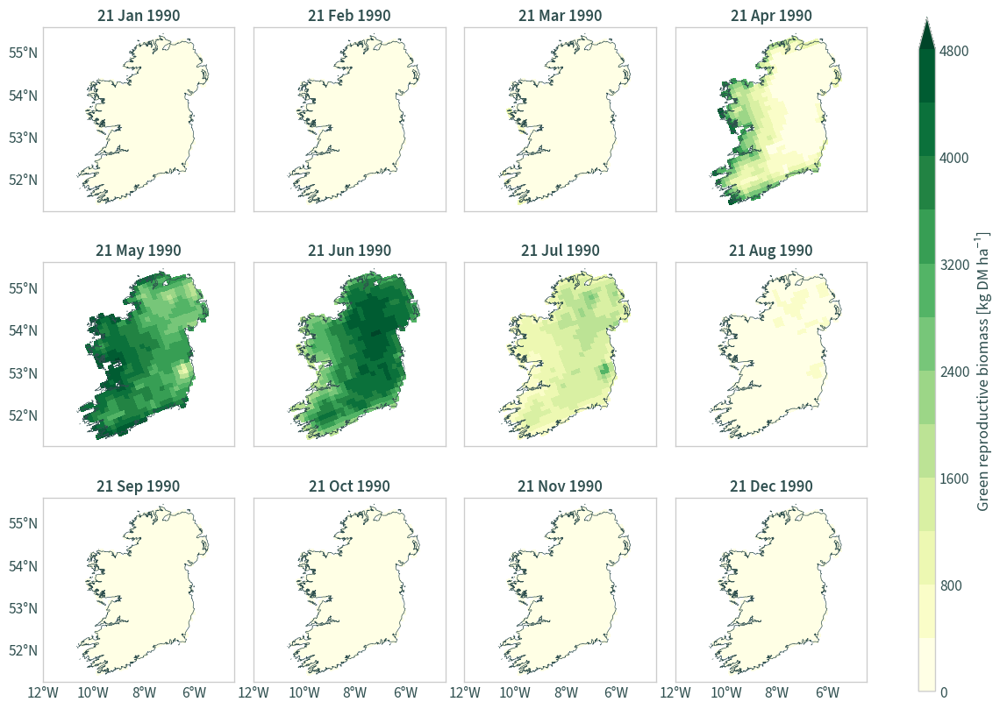

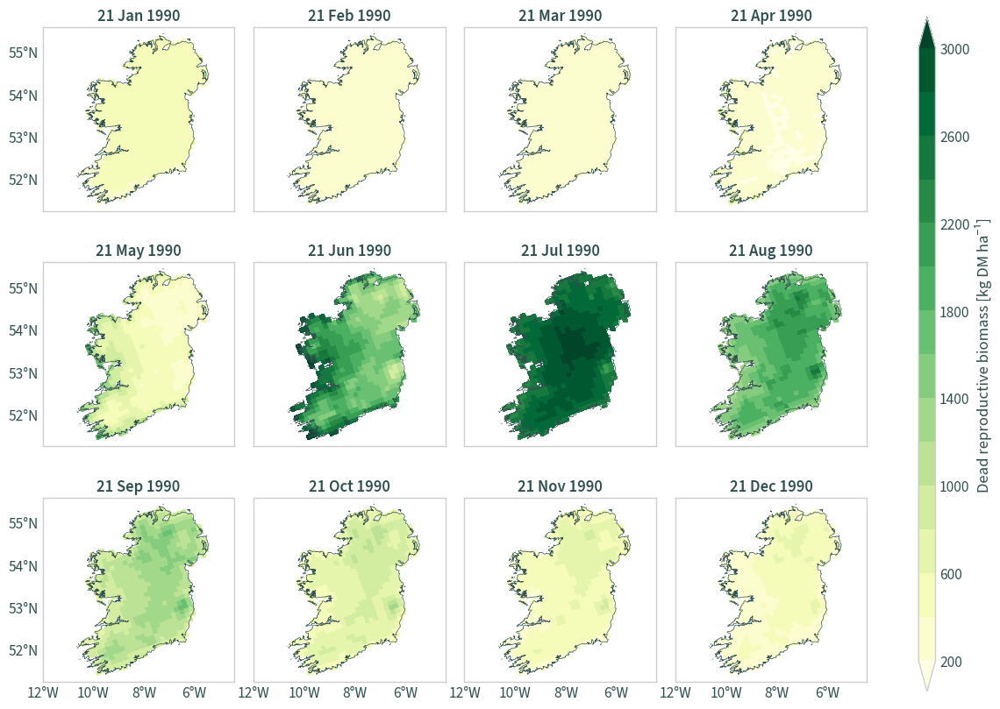

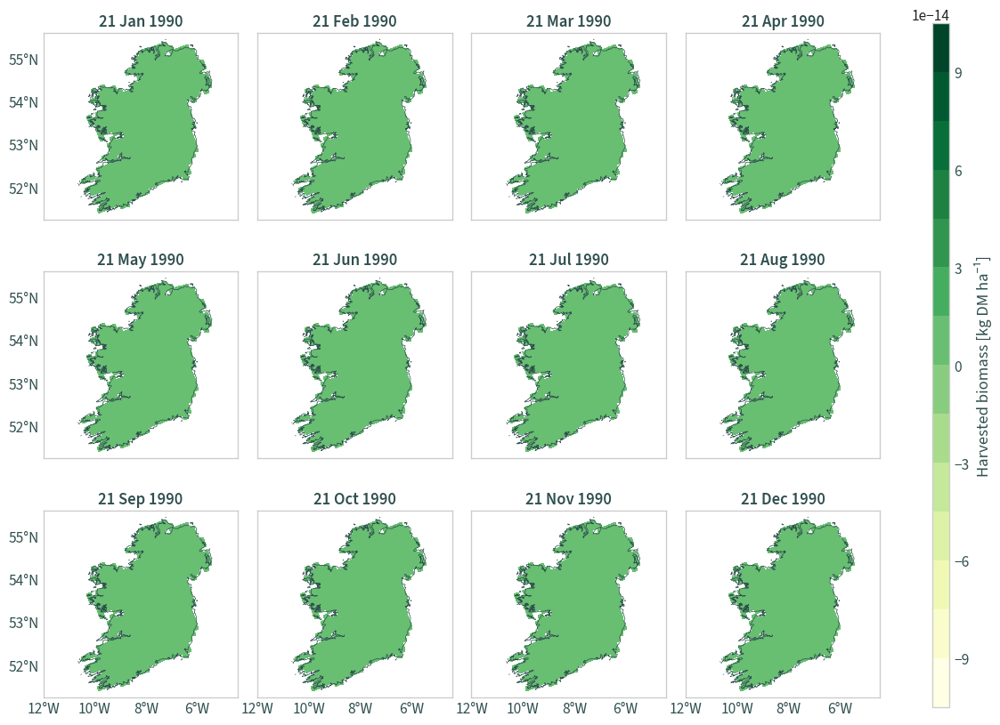

...

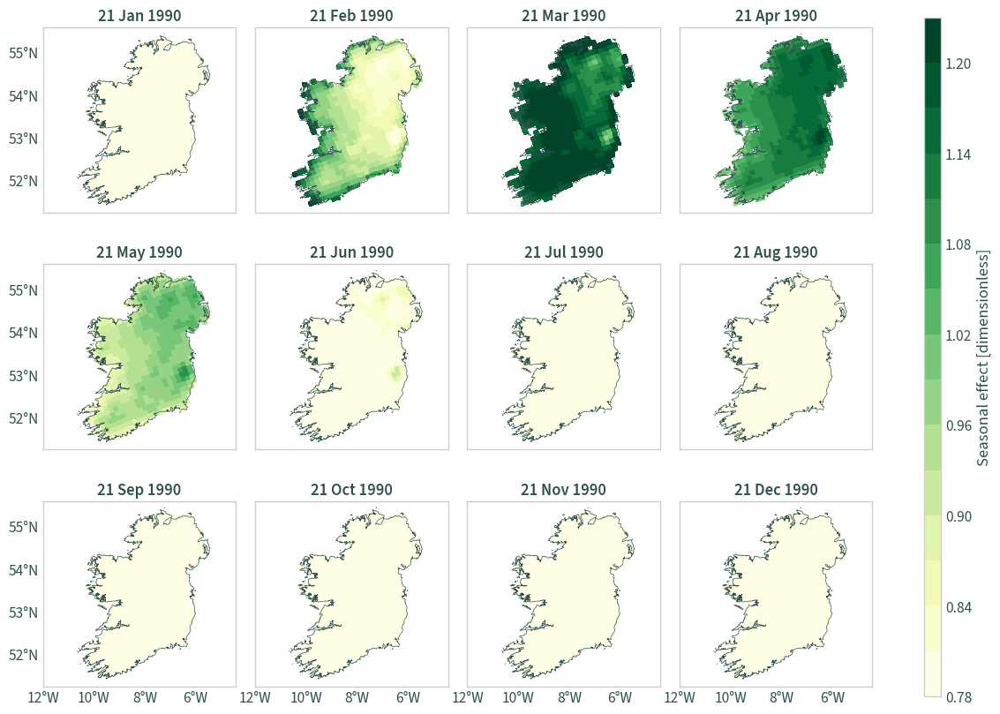

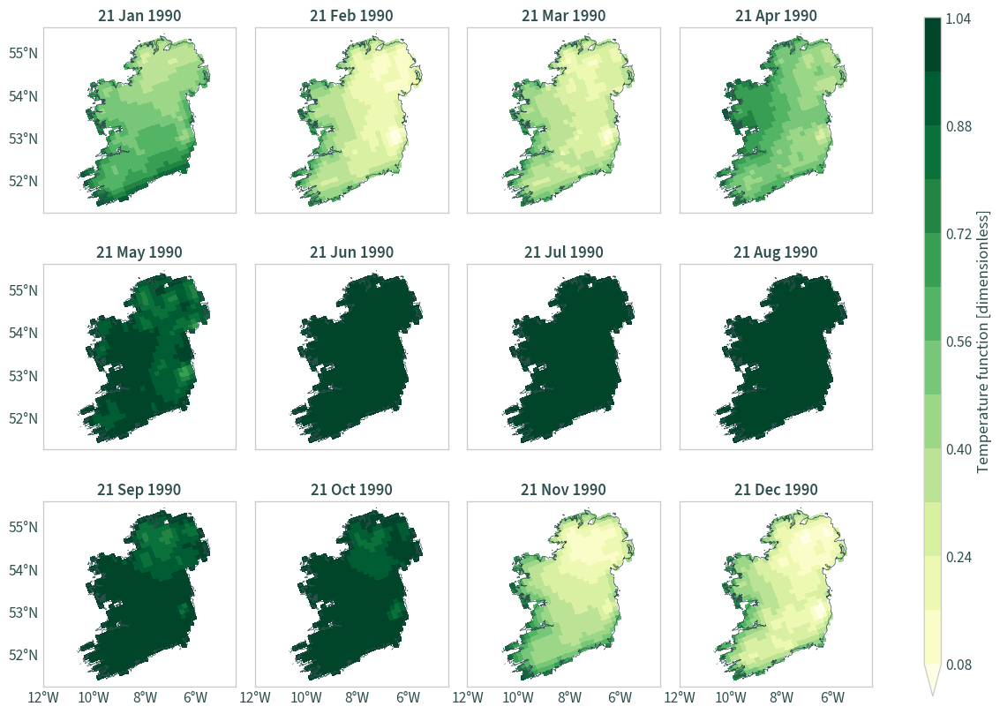

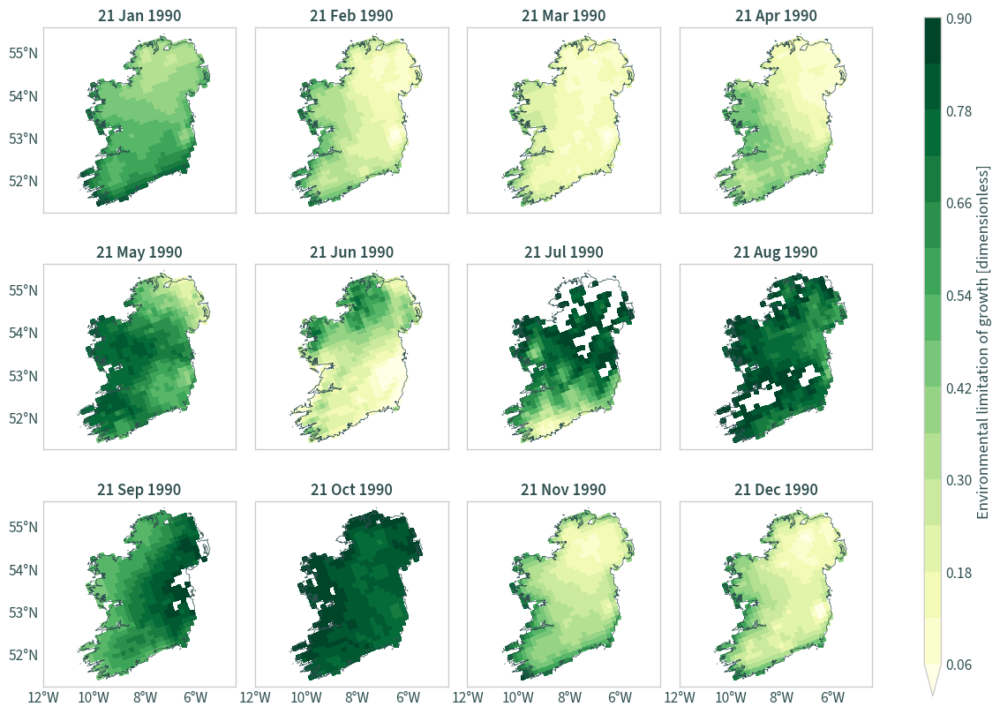

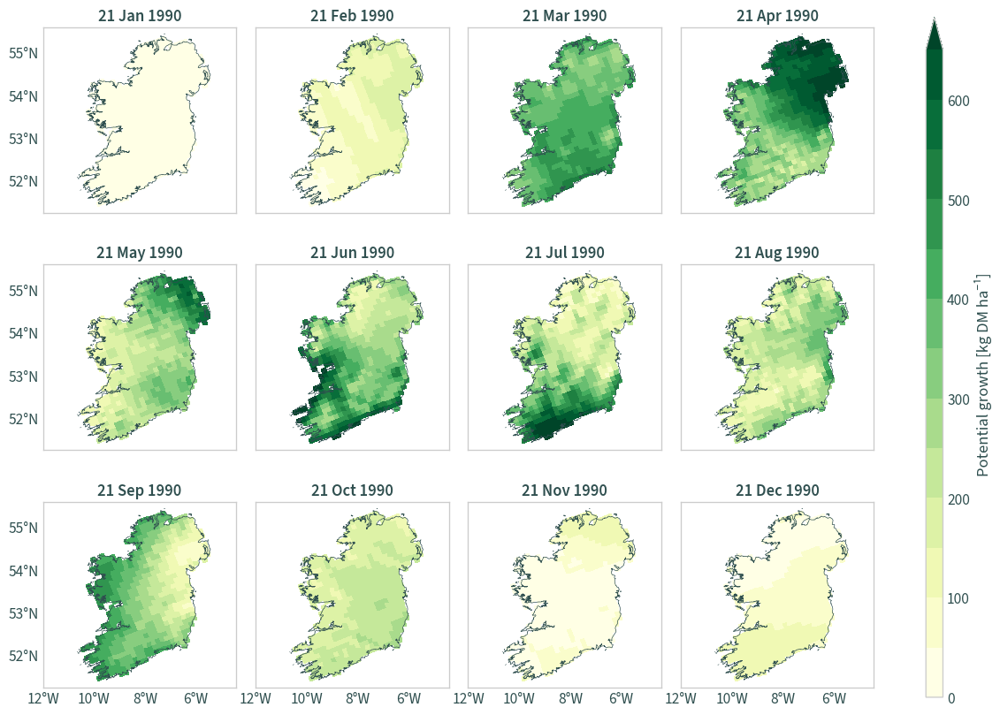

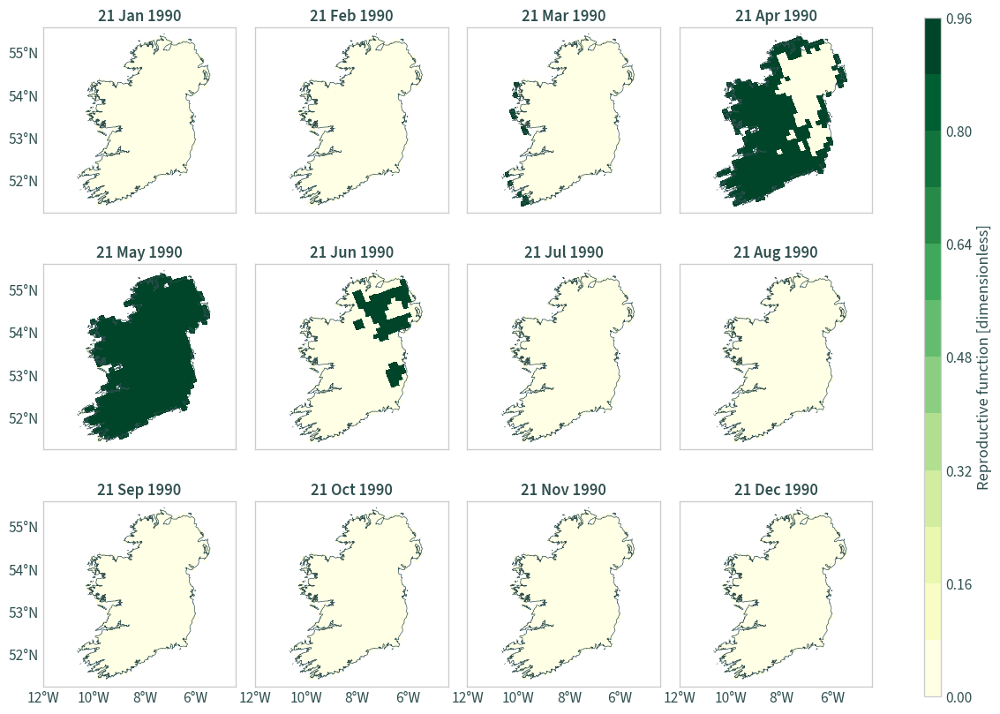

In [22]:
cplt.plot_facet_map_variables(data_ie, ie)

#### Point subset

In [23]:
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

data_ie

<xarray.Dataset>
Dimensions:       (time: 365)
Coordinates:
    lat           float64 dask.array<chunksize=(), meta=np.ndarray>
    lon           float64 dask.array<chunksize=(), meta=np.ndarray>
    rlat          float64 4.015
    rlon          float64 -16.05
  * time          (time) datetime64[ns] 1990-01-01T12:00:00 ... 1990-12-31T12...
    height        float64 ...
    rotated_pole  int64 ...
    spatial_ref   int64 ...
Data variables: (12/18)
    gv_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    dv_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    gr_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    dr_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    h_b           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    i_b           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    ...            ...
    dra           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    sea           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    ftm           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    env           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    pgr           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    atr           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-13 11:01:06.455671+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'Conventions': 'CF-1.4', 'contact': 'rossby.cordex@smh...
    input_variables:  ['evspsblpot', 'pr', 'rsds', 'tas']

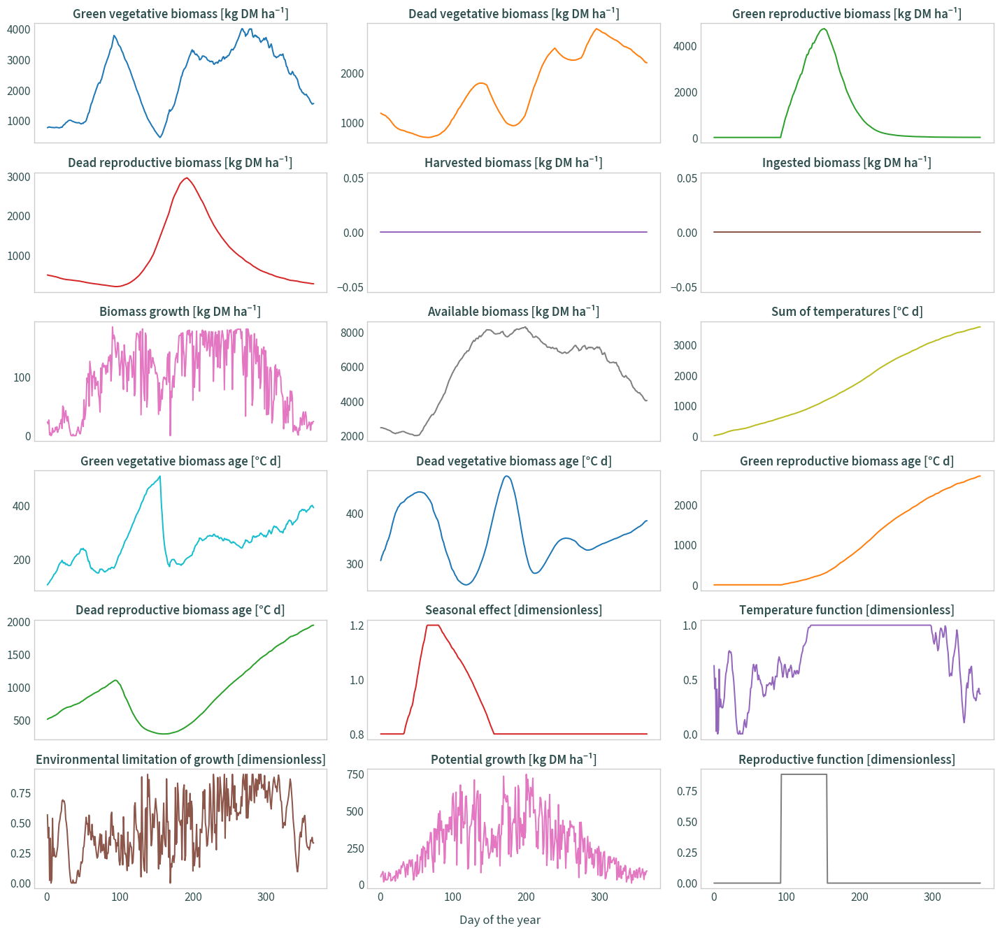

In [24]:
fig, axs = plt.subplots(nrows=6, ncols=3, figsize=(15, 14), sharex=True)

# cycle colours: https://stackoverflow.com/a/53523348
colors = plt.rcParams["axes.prop_cycle"]()

for v, ax in zip(data_ie.data_vars, axs.flat):
    color = next(colors)["color"]
    ax.plot(data_ie["time"].dt.dayofyear, data_ie[v], color=color)
    ax.set_title(
        data_ie[v].attrs["long_name"] + " [" + data_ie[v].attrs["units"] + "]"
    )

fig.supxlabel("Day of the year")

# fig.suptitle(f"ModVege outputs, historical ({LON}, {LAT})")

plt.tight_layout()

plt.show()

## HiResIreland

### rcp85

In [25]:
# define the name of the input timeseries file
TS_FILE = os.path.join(
    "data", "HiResIreland", "rcp85",
    "evspsblpot_pr_rsds_tas_COSMO5_MPI-ESM-LR_rcp85_4km.nc"
)

OUT_DIR = os.path.join(DATA_DIR, "hiresireland", "rcp85")

In [26]:
# # run the main function using the example data
# run_modvege(
#     input_params_file=PARAMS_FILE,
#     input_timeseries_file=TS_FILE,
#     out_dir=OUT_DIR
# )

In [27]:
OUT_FILE = os.path.join(
    OUT_DIR,
    "modvege_COSMO5_MPI-ESM-LR_rcp85_4km_2055.nc"
)

data = xr.open_dataset(
    OUT_FILE,
    chunks="auto",
    decode_coords="all"
)

data

<xarray.Dataset>
Dimensions:       (time: 365, rlat: 113, rlon: 85)
Coordinates:
  * time          (time) datetime64[ns] 2055-01-01T10:30:00 ... 2055-12-31T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 ...
    rotated_pole  int64 ...
    spatial_ref   int64 ...
Data variables: (12/18)
    gv_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    dv_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    gr_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    dr_b          (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    h_b           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    i_b           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    ...            ...
    dra           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    sea           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    ftm           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    env           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    pgr           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
    atr           (time, rlat, rlon) float32 dask.array<chunksize=(365, 113, 85), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-13 15:28:53.819469+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'CDI': 'Climate Data Interface version 1.9.5 (http://m...
    input_variables:  ['rsds', 'pr', 'tas', 'evspsblpot']

#### Time subset

In [28]:
data_ie = data.sel(
    time=[
        f"2055-{month}-21T10:30:00.000000000" for month in sorted(
            list(set(data["time"].dt.month.values))
        )
    ]
)

data_ie

<xarray.Dataset>
Dimensions:       (time: 12, rlat: 113, rlon: 85)
Coordinates:
  * time          (time) datetime64[ns] 2055-01-21T10:30:00 ... 2055-12-21T10...
    lon           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
    lat           (rlat, rlon) float32 dask.array<chunksize=(113, 85), meta=np.ndarray>
  * rlon          (rlon) float64 -1.54 -1.505 -1.47 -1.435 ... 1.33 1.365 1.4
  * rlat          (rlat) float64 -1.945 -1.91 -1.875 -1.84 ... 1.905 1.94 1.975
    height_2m     float32 ...
    rotated_pole  int64 ...
    spatial_ref   int64 ...
Data variables: (12/18)
    gv_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    dv_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    gr_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    dr_b          (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    h_b           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    i_b           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    ...            ...
    dra           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    sea           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    ftm           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    env           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    pgr           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
    atr           (time, rlat, rlon) float32 dask.array<chunksize=(12, 113, 85), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-13 15:28:53.819469+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'CDI': 'Climate Data Interface version 1.9.5 (http://m...
    input_variables:  ['rsds', 'pr', 'tas', 'evspsblpot']

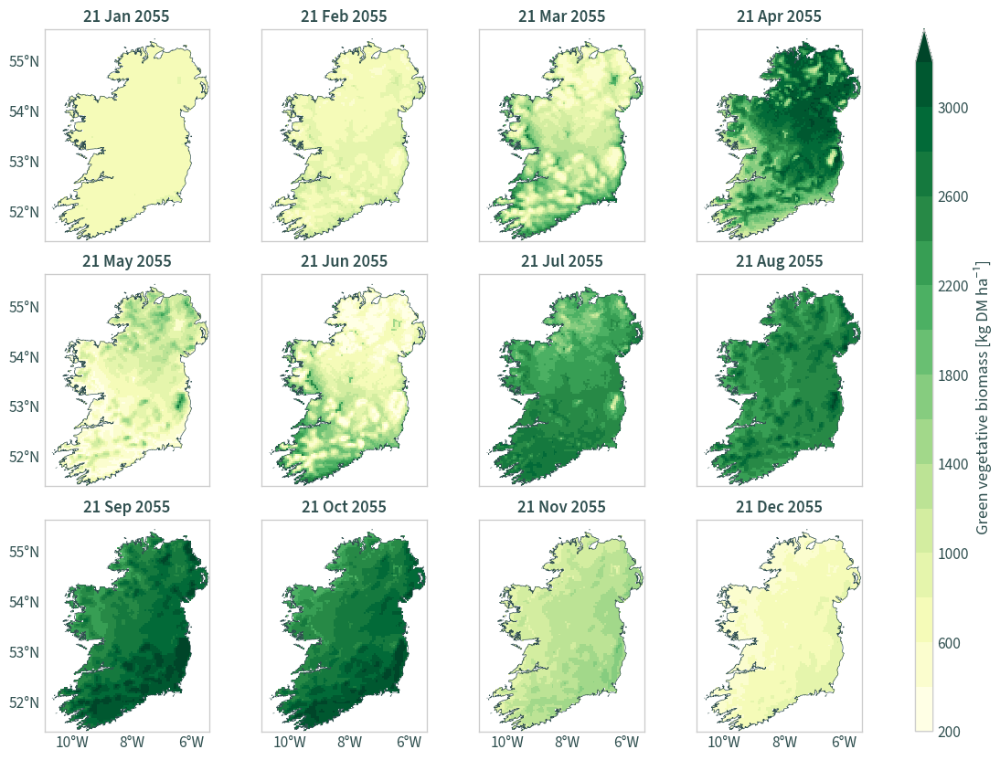

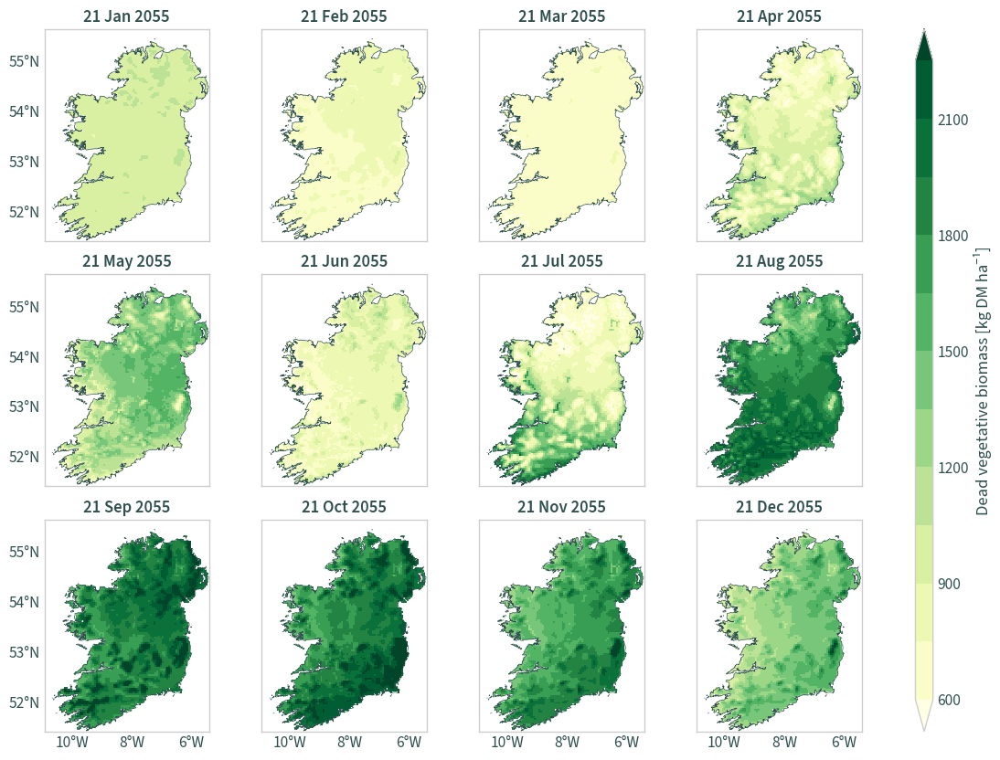

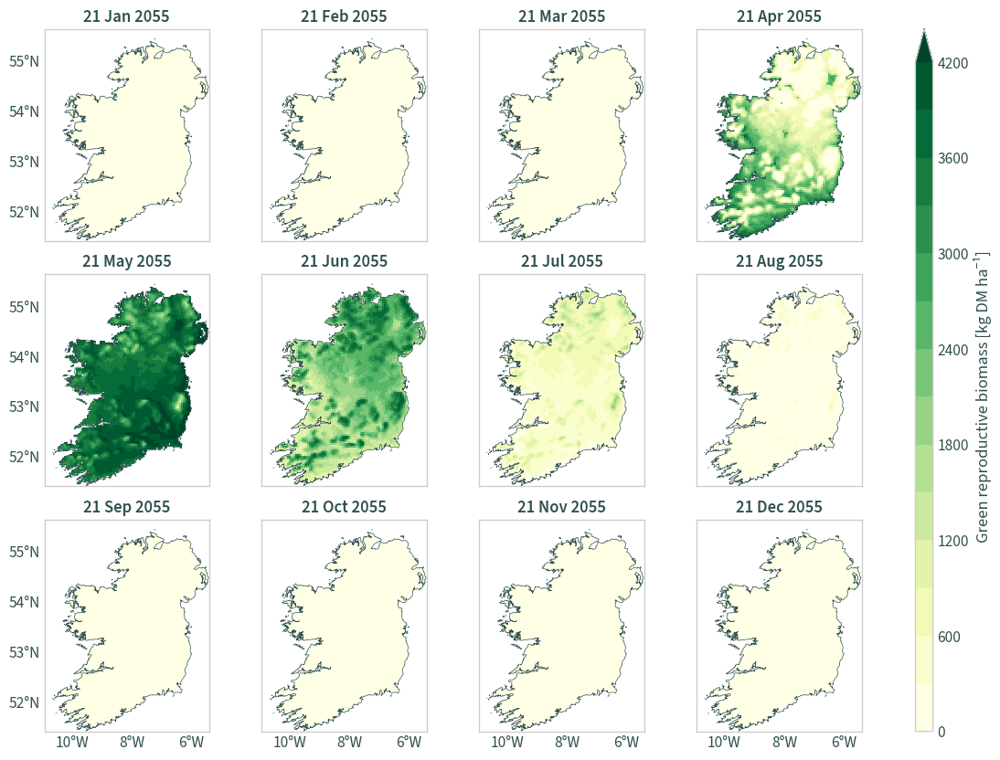

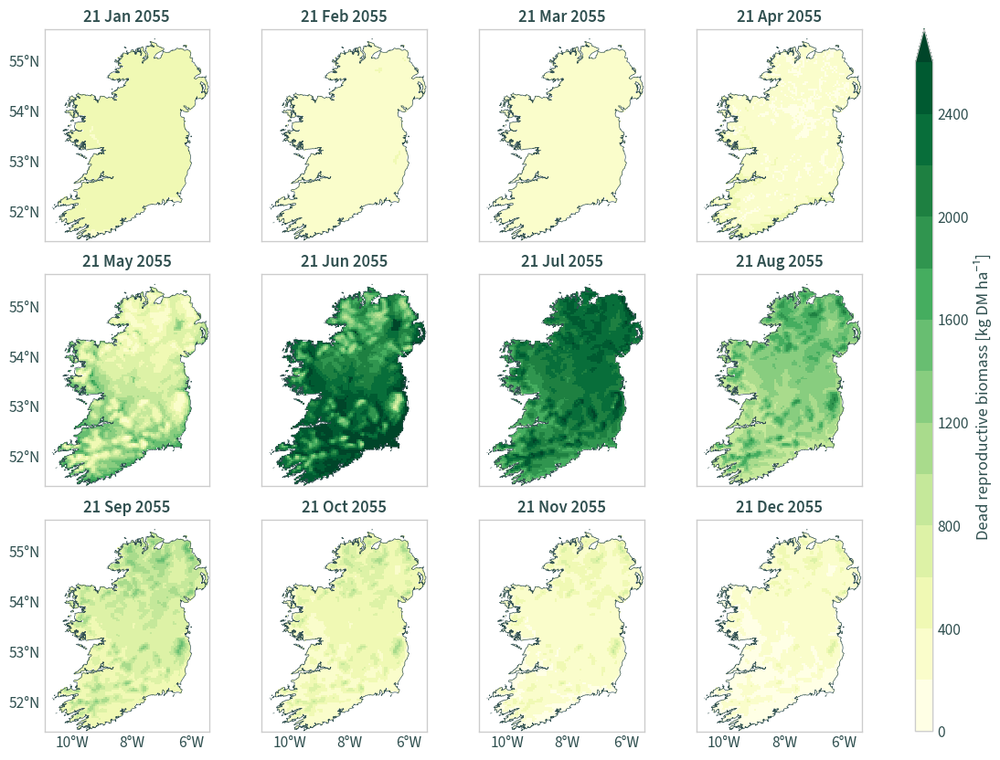

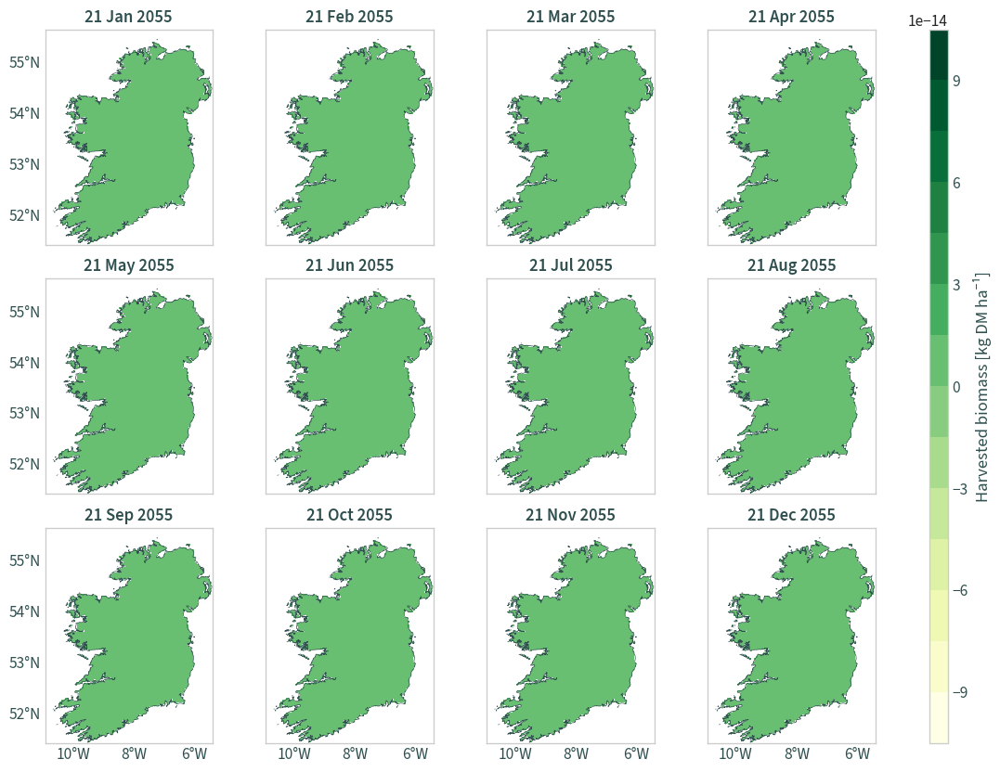

...

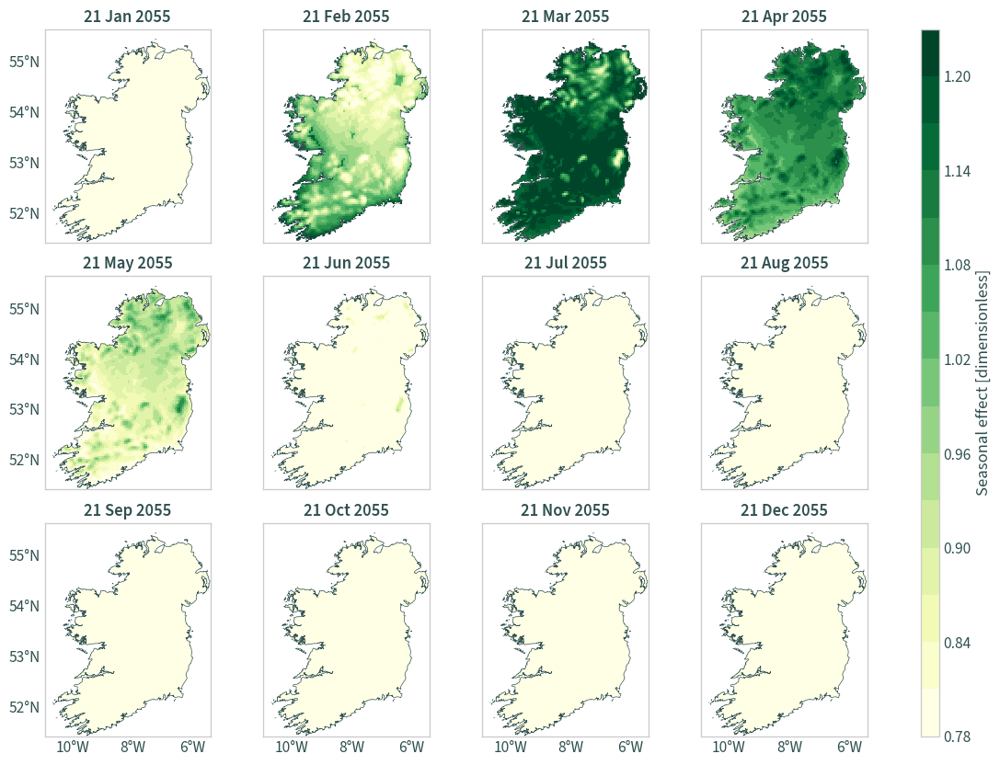

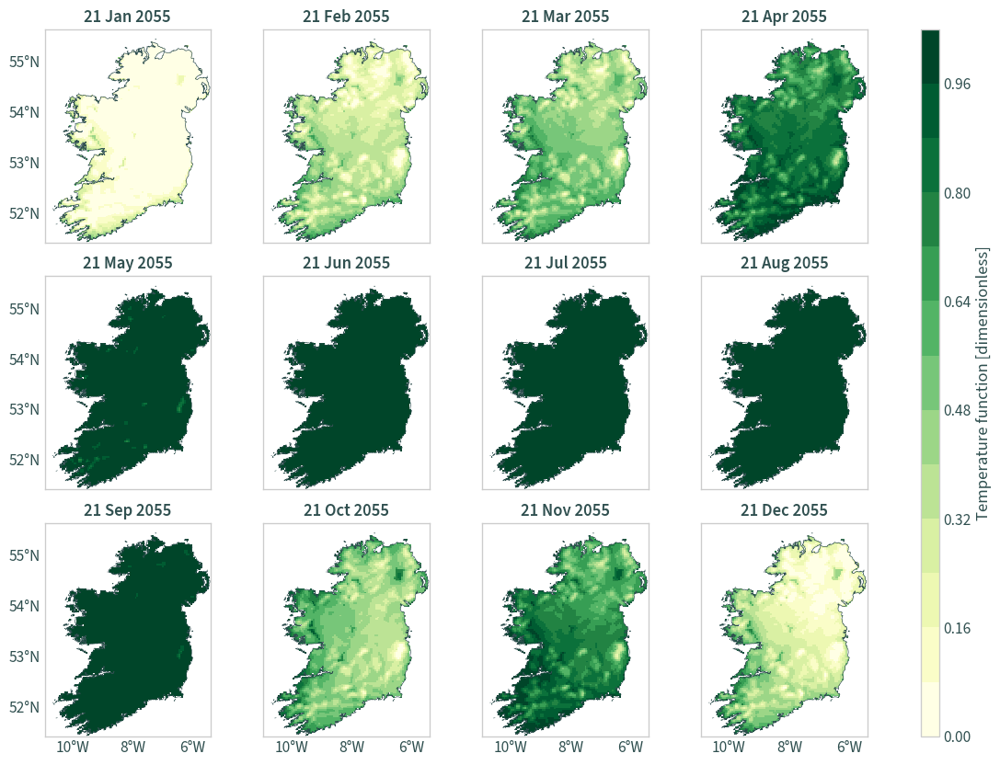

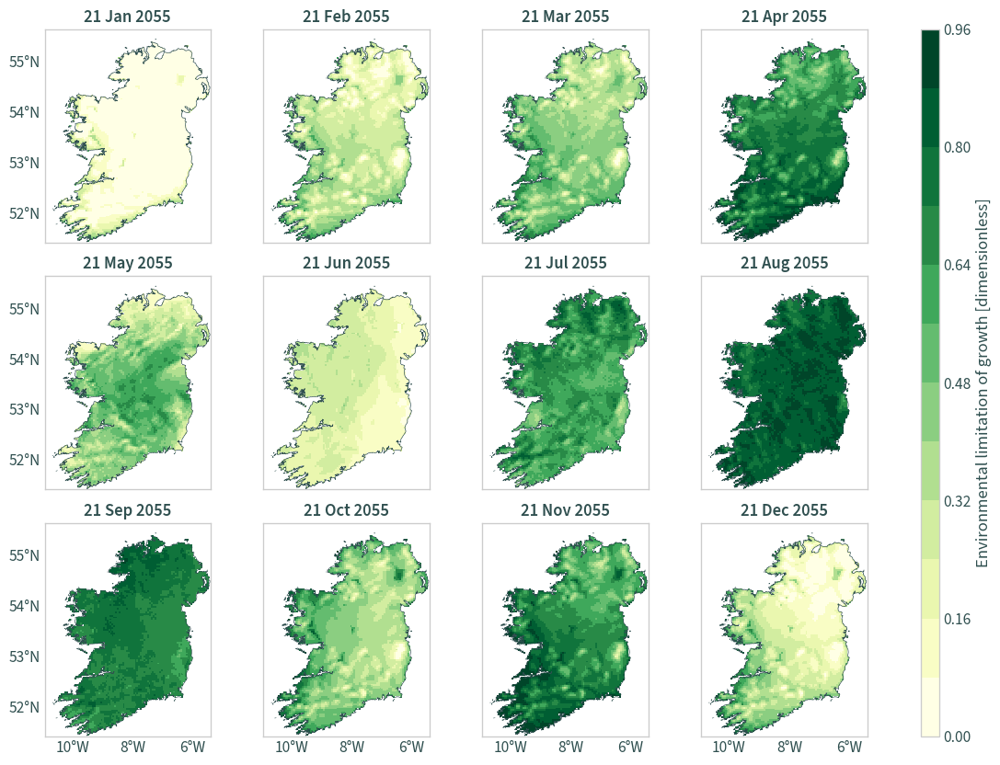

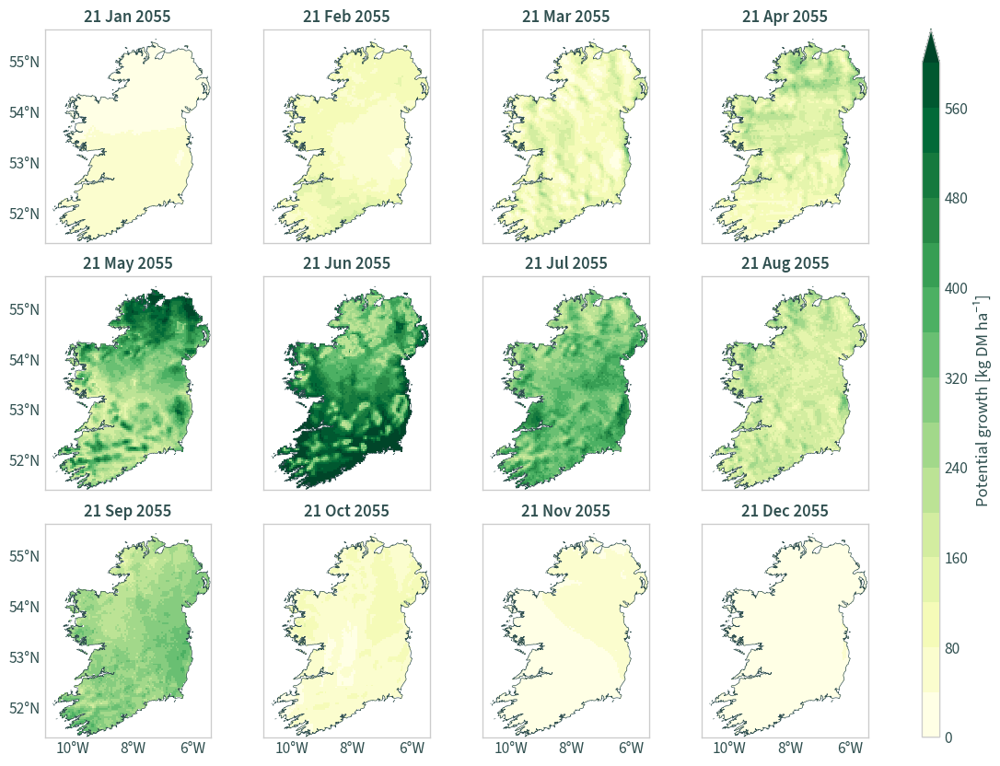

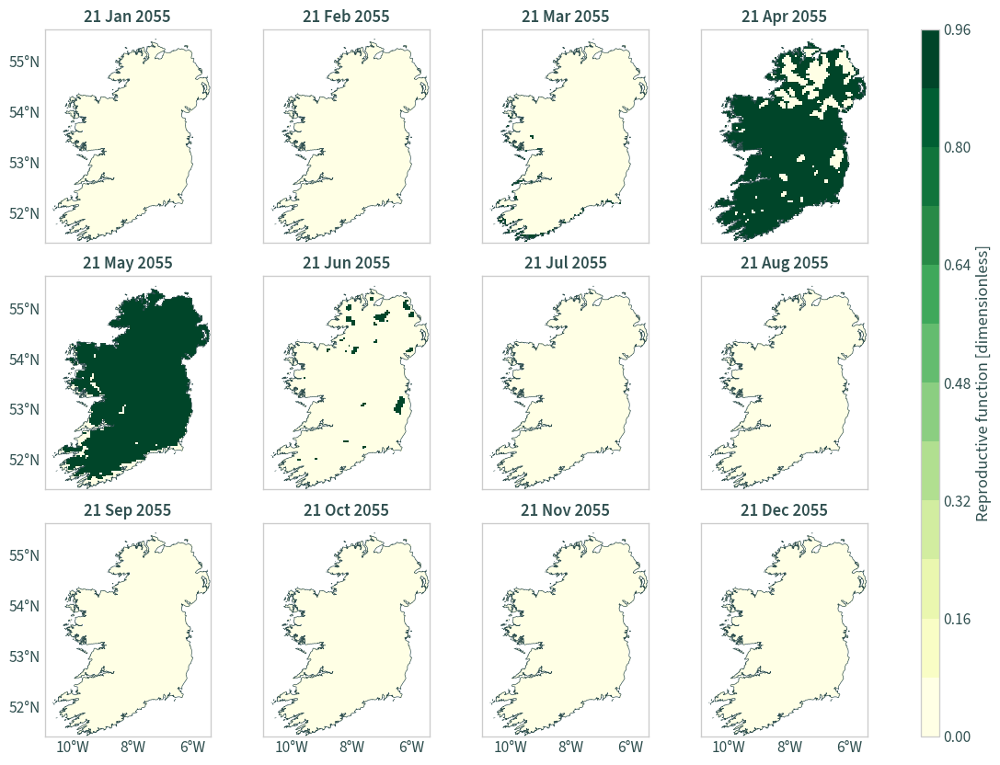

In [29]:
cplt.plot_facet_map_variables(data_ie, ie)

#### Point subset

In [30]:
cds = cplt.rotated_pole_point(data=data, lon=LON, lat=LAT)

data_ie = data.sel({"rlon": cds[0], "rlat": cds[1]}, method="nearest")

data_ie

<xarray.Dataset>
Dimensions:       (time: 365)
Coordinates:
  * time          (time) datetime64[ns] 2055-01-01T10:30:00 ... 2055-12-31T10...
    lon           float32 dask.array<chunksize=(), meta=np.ndarray>
    lat           float32 dask.array<chunksize=(), meta=np.ndarray>
    rlon          float64 -0.35
    rlat          float64 -1.56
    height_2m     float32 ...
    rotated_pole  int64 ...
    spatial_ref   int64 ...
Data variables: (12/18)
    gv_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    dv_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    gr_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    dr_b          (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    h_b           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    i_b           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    ...            ...
    dra           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    sea           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    ftm           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    env           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    pgr           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
    atr           (time) float32 dask.array<chunksize=(365,), meta=np.ndarray>
Attributes:
    creation_date:    2022-10-13 15:28:53.819469+00:00
    contact:          nstreethran@ucc.ie
    frequency:        day
    references:       https://github.com/ClimAg
    input_data:       {'CDI': 'Climate Data Interface version 1.9.5 (http://m...
    input_variables:  ['rsds', 'pr', 'tas', 'evspsblpot']

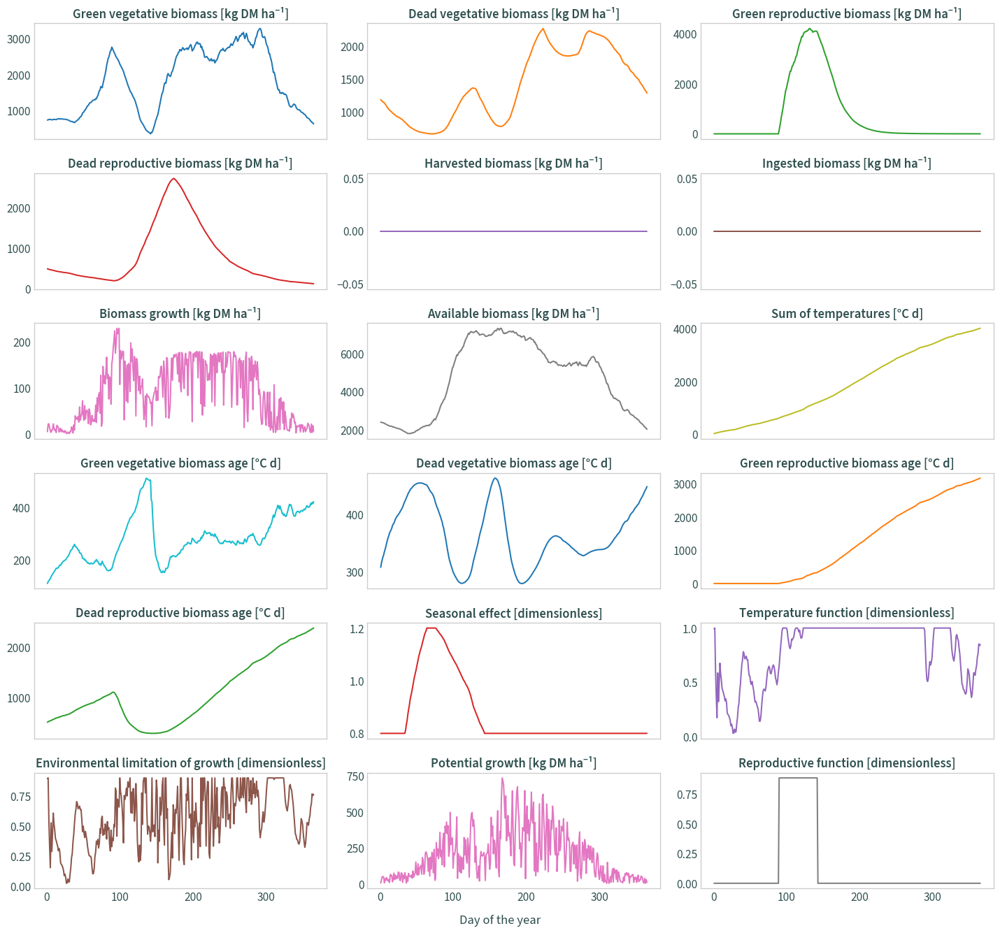

In [31]:
fig, axs = plt.subplots(nrows=6, ncols=3, figsize=(15, 14), sharex=True)

# cycle colours: https://stackoverflow.com/a/53523348
colors = plt.rcParams["axes.prop_cycle"]()

for v, ax in zip(data_ie.data_vars, axs.flat):
    color = next(colors)["color"]
    ax.plot(data_ie["time"].dt.dayofyear, data_ie[v], color=color)
    ax.set_title(
        data_ie[v].attrs["long_name"] + " [" + data_ie[v].attrs["units"] + "]"
    )

fig.supxlabel("Day of the year")

# fig.suptitle(f"ModVege outputs, rcp85 ({LON}, {LAT})")

plt.tight_layout()

plt.show()

## Model definition

Compartments representing the structural components of herbage:
- Green vegetative (GV) - green leaves and sheath
- Dead vegetative (DV) - dead leaves and sheath
- Green reproductive (GR) - green stems and flowers
- Dead reproductive (DR) - dead stems and flowers

Compartment description:
- Standing biomass (BM) [kg DM ha⁻¹]
- Age of biomass (AGE) [°C d] (degree day - units of thermal time)
- Organic matter digestibility (OMD)

### List of timeseries variables

- Mean daily temperature (*T*) [°C]
- Incident photosynthetically active radiation (PAR_i) [MJ m⁻²]
- Precipitation (PP) [mm]
- Potential evapotranspiration (PET) [mm]

### List of parameters (constants)

See Tables 2 and 3 in Jouven et al. (2006).
The functional groups and traits were parameterised for the Auvergne region in
France, which has a temperate climate.
Functional traits for Group A is used (species found in fertile sites, adapted
to frequent defoliation (e.g. perennial ryegrass; *Lolium perenne*).
Characteristic traits include high specific leaf area, high digestibility,
short leaf lifespan, and early reproductive growth and flowering).
- Specific leaf area (SLA) [0.033 m² g⁻¹]
- Percentage of laminae in the green vegetative compartment (%LAM) [0.68]
- Sum of temperatures at the beginning of the reproductive period (ST₁)
  [600 °C d]
- Sum of temperatures at the end of the reproductive period (ST₂)
  [1200 °C d]
- Maximum seasonal effect (maxSEA) [1.20]
- Minimum seasonal effect (minSEA) [0.80]
- Leaf lifespan (LLS) [500 °C d]
- Maximum organic matter digestibility of the green vegetative compartment
  (maxOMD_GV) [0.90]
- Minimum organic matter digestibility of the green vegetative compartment
  (minOMD_GV) [0.75]
- Maximum organic matter digestibility of the green reproductive compartment
  (maxOMD_GR) [0.90]
- Minimum organic matter digestibility of the green reproductive compartment
  (minOMD_GR) [0.65]
- Bulk density of the green vegetative compartment (BD_GV) [850 g DM m⁻³]
- Bulk density of the dead vegetative compartment (BD_DV) [500 g DM m⁻³]
- Bulk density of the green reproductive compartment (BD_GR) [300 g DM m⁻³]
- Bulk density of the dead reproductive compartment (BD_DR) [150 g DM m⁻³]
- Rate of biomass loss with respiration for the green vegetative compartment
  (σ_GV) [0.4]
- Rate of biomass loss with respiration for the green reproductive compartment
  (σ_GR) [0.2]
- Minimum temperature for growth (*T*₀) [4 °C]
- Minimum temperature for optimal growth (*T*₁) [10 °C]
- Maximum temperature for optimal growth (*T*₂) [20 °C]
- Basic senescence rate for the green vegetative compartment (K_GV) [0.002]
- Basic senescence rate for the green reproductive compartment (K_GR) [0.001]
- Basic abscission rate for the dead vegetative compartment (Kl_DV) [0.001]
- Basic abscission rate for the dead reproductive compartment (Kl_DR) [0.0005]
- Organic matter digestibility for the dead vegetative compartment (OMD_DV)
  [0.45]
- Organic matter digestibility for the dead reproductive compartment (OMD_DR)
  [0.40]
- Maximum radiation use efficiency (RUE_max) [3 g DM MJ⁻¹]

### Model functions

Biomass of the green compartments, daily:

- difference between $\mathrm{GRO}$, distributed between $\mathrm{GV}$ and $\mathrm{GR}$ compartments with a $\mathrm{REP}$, and $\mathrm{SEN}$

- for $\textrm{GV}$:

$$\frac{\mathrm{d BM_{GV}}}{\mathrm{d}t} = \mathrm{GRO_{GV}} - \mathrm{SEN_{GV}}$$
$$\mathrm{GRO_{GV}} = \mathrm{GRO} \times (1 - \mathrm{REP})$$

- for $\textrm{GR}$:

$$\frac{\mathrm{d BM_{GR}}}{\mathrm{d}t} = \mathrm{GRO_{GR}} - \mathrm{SEN_{GR}}$$

$$\mathrm{GRO_{GR}} = \mathrm{GRO} \times \mathrm{REP}$$

Biomass of the dead compartments, daily:

- difference between $\mathrm{SEN}$ and $\mathrm{ABS}$

- for $\textrm{DV}$:

$$\frac{\mathrm{d BM_{DV}}}{\mathrm{d}t} = (1 - \sigma_{\textrm{GV}}) \times \mathrm{SEN_{GV}} - \mathrm{ABS_{DV}}$$

- for $\textrm{DR}$:

$$\frac{\mathrm{d BM_{DR}}}{\mathrm{d}t} = (1 - \sigma_{\textrm{GR}}) \times \mathrm{SEN_{GR}} - \mathrm{ABS_{DR}}$$

Mean age of the biomass in each compartment:

- calculated daily as the weighted average of the age of the residual biomass and the age of the biomass entering the pool, which *by definition is considered zero*
- the age of the residual biomass is increased daily by $T$, *if this temperature is positive*
- for each compartment, age can increase or decrease depending on the relative impacts of the inflow of new biomass and the ageing of the old biomass

- for $\textrm{GV}$:

$$\frac{\mathrm{d AGE_{GV}}}{\mathrm{d}t} = \frac{\mathrm{BM_{GV}} - \mathrm{SEN_{GV}}}{\mathrm{BM_{GV}} - \mathrm{SEN_{GV}} + \mathrm{GRO_{GV}}} \times (\mathrm{AGE_{GV}} + T) - \mathrm{AGE_{GV}}$$

- for $\textrm{GR}$:

$$\frac{\mathrm{d AGE_{GR}}}{\mathrm{d}t} = \frac{\mathrm{BM_{GR}} - \mathrm{SEN_{GR}}}{\mathrm{BM_{GR}} - \mathrm{SEN_{GR}} + \mathrm{GRO_{GR}}} \times (\mathrm{AGE_{GR}} + T) - \mathrm{AGE_{GR}}$$

- for $\textrm{DV}$:

$$\frac{\mathrm{d AGE_{DV}}}{\mathrm{d}t} = \frac{\mathrm{BM_{DV}} - \mathrm{ABS_{DV}}}{\mathrm{BM_{DV}} - \mathrm{ABS_{DV}} + (1 - \sigma_\mathrm{GV}) \times \mathrm{SEN_{GV}}} \times (\mathrm{AGE_{DV}} + T) - \mathrm{AGE_{DV}}$$

- for $\textrm{DR}$:

$$\frac{\mathrm{d AGE_{DR}}}{\mathrm{d}t} = \frac{\mathrm{BM_{DR}} - \mathrm{ABS_{DR}}}{\mathrm{BM_{DR}} - \mathrm{ABS_{DR}} + (1 - \sigma_\mathrm{GR}) \times \mathrm{SEN_{GR}}} \times (\mathrm{AGE_{DR}} + T) - \mathrm{AGE_{DR}}$$

$\textrm{OMD}$:

- of dead compartments is *constant*
- of green components decreases linearly with $\textrm{AGE}$

- maximum digestibility ($\textrm{maxOMD}$) is the theoretical value at zero age
- minimum digestibility ($\textrm{minOMD}$) is the theoretical value for maximum age, which are the leaf lifespan for $\textrm{GV}$ ($\textrm{LLS}$, °C) and the duration of reproductive growth for $\textrm{DR}$
- the duration of reproductive growth (°C d) is the difference between the sum of temperatures at the end ($\textrm{ST}_2$, °C d) and at the beginning ($\textrm{ST}_1$, °C d) of the reproductive period

- for $\textrm{GV}$:

$$\mathrm{OMD_{GV}} = \mathrm{maxOMD_{GV}} - \frac{\mathrm{AGE_{GV}} \times (\mathrm{maxOMD_{GV}} - \mathrm{minOMD_{GV}})}{\textrm{LLS}}$$

- for $\textrm{GR}$:

$$\mathrm{OMD_{GR}} = \mathrm{maxOMD_{GR}} - \frac{\mathrm{AGE_{GR}} \times (\mathrm{maxOMD_{GR}} - \mathrm{minOMD_{GR}})}{\textrm{ST}_2 - \textrm{ST}_1}$$

### Growth functions

$\mathrm{GRO}$:

- only the *above-ground biomass* is simulated
- $\mathrm{GRO}$ is calculated daily as the product of $\mathrm{PGRO}$ obtained in optimum conditions, a function representing growth limitation by environmental variables related to soil and climate characterisitics ($\mathrm{ENV}$), and a threshold function empirically accounting for the seasonal pattern of shoot growth because of reserve storage and mobilisation ($\mathrm{SEA}$)
- $\mathrm{SEA}$ is an empirical function, derived from literature, as there are few data available on the dynamics of storage and mobilization of reserves for the many species that constitute permanent grasslands
- $\mathrm{SEA}$ is low during autumn and winter; it increases from the onset of growth, i.e. when the cumulated thermal time from 1 January ($\mathrm{ST}$, °C d) is above 200 °C d and reaches a peak ($\mathrm{maxSEA}$) when $\mathrm{ST}_1 - 200 < \mathrm{ST} < \mathrm{ST}_1 - 100$, before the period of reproductive growth

$$\mathrm{GRO} = \mathrm{PGRO} \times \mathrm{ENV} \times \mathrm{SEA}$$

$\mathrm{PGRO}$:

- product of $\mathrm{PAR}_i$, $\mathrm{RUE_{max}}$, and $\mathrm{LAI}$
- $\mathrm{LAI}$ is the product of $\mathrm{SLA}$, $\mathrm{BM_{GV}}$, and $\%\mathrm{LAM}$
- the model extinction coefficient is set at a constant value of 0.6

$$\mathrm{PGRO} = \mathrm{PAR}_i \times \mathrm{RUE_{max}} \times \big(1 - \exp(-0.6 \times \mathrm{LAI})\big) \times 10$$

$$\mathrm{LAI} = \mathrm{SLA} \times \frac{\mathrm{BM_{GV}}}{10} \times \%\mathrm{LAM}$$

$\mathrm{ENV}$:

- product of the $\textrm{NI}$ and three functions:
  - $f(\mathrm{PAR}_i)$
  - $f(T)$: photosynthesis activation when the 10-d moving average temperature ($T_{\mathrm{m}10}$, °C) is above $T_0$ (°C) and photosynthesis simulation by $T$
  - $f(W)$: growth limitation when $W$ increases
- the $\mathrm{WR}$ vary between 0 and $\mathrm{WHC}$

$$\mathrm{ENV} = \mathrm{NI} \times f(\mathrm{PAR}_i) \times f(T) \times f(W)$$

$W$:

- $\mathrm{PP}$ fill the $\mathrm{WHC}$, increasing $\mathrm{WR}$
- $\mathrm{AET}$ empties the $\mathrm{WR}$
- it is considered that $\mathrm{AET}$ is equal to the $\mathrm{PET}$ when the cover intercepts approximately 0.95 of the $\mathrm{PAR}_i$, that is when $\mathrm{LAI} > 3$
- $\mathrm{AET}$ is proportional to $\mathrm{LAI}$ when the proportion of intercepted radiation is lower than 0.95 ($\mathrm{LAI} < 3$)

$$W = \frac{\mathrm{WR}}{\mathrm{WHC}}$$

$$\textrm{WR} = \max(0, \mathrm{WR} + \mathrm{PP} - \mathrm{AET})$$

$$\mathrm{AET} = \min\left(\mathrm{PET}, \mathrm{PET} \times \frac{\mathrm{LAI}}{3}\right)$$

$\mathrm{REP}$:

- $\mathrm{CUT}$ is a Boolean function that stops reproductive growth

$$\mathrm{REP = \left(0.25 + \frac{(1 - 0.25) \times (\mathrm{NI} - 0.35)}{1 - 0.35} \times \mathrm{CUT} \right)}$$

### Senescence and abscission functions

Senescence:

- if $T > T_0$:

$$\mathrm{SEN_{GV}} = K_{\mathrm{GV}} \times \mathrm{BM_{GV}} \times T \times f(\mathrm{AGE_{GV}})$$

$$\mathrm{SEN_{GR}} = K_{\mathrm{GR}} \times \mathrm{BM_{GR}} \times T \times f(\mathrm{AGE_{GR}})$$

- if $T < 0$:

$$\mathrm{SEN_{GV}} = K_{\mathrm{GV}} \times \mathrm{BM_{GV}} \times |T|$$

$$\mathrm{SEN_{GR}} = K_{\mathrm{GR}} \times \mathrm{BM_{GR}} \times |T|$$

Abscission:

$$\mathrm{ABS_{DV}} = Kl_{\mathrm{DV}} \times \mathrm{BM_{DV}} \times T \times f(\mathrm{AGE_{DV}})$$

$$\mathrm{ABS_{DR}} = Kl_{\mathrm{DR}} \times \mathrm{BM_{DR}} \times T \times f(\mathrm{AGE_{DR}})$$

### Harvested biomass

$$\mathrm{resBM_{GV}} = 0.05 \times 10 \times \mathrm{BD_{GV}}$$

$$\mathrm{resBM_{GR}} = 0.05 \times 10 \times \mathrm{BD_{GR}}$$

$$\mathrm{resBM_{DV}} = 0.05 \times 10 \times \mathrm{BD_{DV}}$$

$$\mathrm{resBM_{DR}} = 0.05 \times 10 \times \mathrm{BD_{DR}}$$